# COS360 - Otimização
## Trabalho de Programação Não Linear Irrestrita
### Métodos de descida com busca de Armijo

*   Método do Gradiente
*   Método de Newton
*   Quase-Newton (BFGS).





In [60]:
# imports
!pip install numdifftools
from IPython.display import clear_output
!pip install plotly
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cm
import numdifftools as nd
import warnings
clear_output()

In [61]:
# Configuração de exibição/impressão
pd.set_option('display.float_format', lambda x: '%.8f' % x)
np.set_printoptions(8)
warnings.filterwarnings("ignore")

#Funções utilitárias

In [62]:
def plot_function(f, title, ndim, dom = np.linspace(-5, 5, 500), angle = (20, 20)):
    """
    Função que plota gráficos em 2-d ou 3-d.

    Parâmetros
    ----------------------------------------
    f : callable
        Função objetivo (função custo).
    title : str
        Título do gráfico
    ndim : str (2 ou 3)
        Dimensão da função
    dom : list or np.arange or np.linspace, opcional
        Domínio da função desejado
    angle : tuple,  opcional
        Ângulo para ver o gráfico. Padrão = (20, 20)
    Saída
    ----------------------------------------
    plot
    """

    plt.style.use('fivethirtyeight')

    # 2-d plot: y = f(x)
    if ndim == 2:
        X = dom
        Y  = f(X)

        fig = plt.figure(figsize=(8,8))
        ax = fig.add_subplot(111)
        ax.set_title(title)
        ax.set_xlabel('$x$')
        ax.set_ylabel('$f(x)$')
        ax.plot(X, Y)
        plt.tight_layout()
        plt.show()

    # 3-d plot: z = f(x, y)
    else:
        x, y = dom, dom
        X, Y = np.meshgrid(x, y)
        Z = f([X, Y])
        fig = plt.figure(figsize=(8,8))
        ax = fig.add_subplot(111, projection='3d')
        ax.set_title(title)
        ax.set_xlabel('$x_1$')
        ax.set_ylabel('$x_2$')
        ax.set_zlabel('$f(x_1, x_2)$')
        ax.plot_surface(X, Y, Z, cmap='viridis')
        ax.view_init(angle[0], angle[1])
        plt.tight_layout()
        plt.show()


In [63]:
def plot_results(f, xi, yi, method, dim = [np.linspace(-7, 7, 500), np.linspace(-7, 7, 500)]):

    """
    Função que plota os result

    Parâmetros
    ----------------------------------------
    f : callable
        Função objetivo (função custo).
    xi : np.array
        Valores de x em cada iteração do método
    yi : np.array
        Valores de y em cada iteração do método
    method: str
        Método desejado: '1', '2' ou '3'
    dim : np.linspace, opcional
        Valores de x e y para para plotar as curvas de nível
    Saída
    ----------------------------------------
    plot
  """


    plt.style.use('fivethirtyeight')

    if method.lower().strip() == '1': title = 'Descida do gradiente com busca de Armijo'
    elif method.lower().strip() == '2': title = 'Método de Newton com busca de Armijo'
    else: title = 'Método BFGS com busca de Armijo'

    # z = f(x,y)
    if xi.shape[1] == 2:

      x, y = dim[0], dim[1]
      X, Y = np.meshgrid(x, y)
      Z = f([X, Y])
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))
      plt.suptitle(title, y = 1.05)

      # curvas de nível
      ax1.plot(xi[:,0], xi[:,1], linestyle='--', marker='o', color='black', linewidth = 3)
      ax1.plot(xi[-1,0], xi[-1,1], 'ro', markersize = 11)
      ax1.set(title='Caminho durante a otimização - Curvas de Nível', xlabel='x1', ylabel='x2')
      CS = ax1.contour(X, Y, Z, 15, cmap = 'viridis')
      ax1.clabel(CS, fontsize='smaller', fmt='%1.2f')

      # valor da função custo em cada iteração
      ax2.plot(yi, linestyle='--', marker='o', color='black')
      ax2.plot(len(yi)-1, yi[-1], 'ro', markersize = 11)
      ax2.xaxis.set_major_locator(MaxNLocator(integer=True))
      ax2.set(title = 'Valor da função custo durante a otimização', xlabel='Iterações', ylabel='Valor da função custo')
      ax2.legend(['Busca de Armijo'])

      plt.show()

    # y = f(x)
    else:

      x = dim[0]
      y = f(x)
      fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
      plt.suptitle(title, y = 1.05)

      ax1.plot(xi[:,0], xi[:,1], linestyle='--', marker='o', color='black', linewidth = 3)
      ax1.plot(xi[-1,0], xi[-1,1], 'ro', markersize = 11)
      ax1.set(title='Caminho durante a otimização', xlabel='x1', ylabel='x2')

      ax2.plot(yi, linestyle='--', marker='o', color='black')
      ax2.plot(len(yi)-1, yi[-1], 'ro', markersize = 11)
      ax2.xaxis.set_major_locator(MaxNLocator(integer=True))
      ax2.set(title = 'Valor da função custo durante a otimização', xlabel='Iterações', ylabel='Valor da função custo')
      ax2.legend(['Busca de Armijo'])

      plt.tight_layout()
      plt.show()

In [64]:
# Função printa_resultados (sem alterações)
def printa_resultados(chute, xi, yi, grad_norm, iteracoes_armijo):
    # Número de iterações
    num_iteracoes = len(yi)

    # Ponto inicial arredondado
    chute = np.round(chute, 8)

    # Ponto ótimo (última iteração)
    ponto_otimo = np.round(xi[-1], 8)

    # Valor ótimo (valor da função no ponto ótimo)
    valor_otimo = np.round(yi[-1], 8)

    # Erro de aproximação (norma do gradiente no ponto ótimo)
    erro_aproximacao = np.round(grad_norm[-1], 8)

    # DataFrame com os resultados
    resultados_df = pd.DataFrame({
        'Ponto inicial': [chute],
        'Número de iterações': [num_iteracoes],
        'Número de chamadas de Armijo': [iteracoes_armijo],
        'Ponto ótimo': [ponto_otimo],
        'Valor ótimo': [valor_otimo],
        'Erro de aproximação': [erro_aproximacao]
    })

    return resultados_df

In [65]:
def processa_chutes(chutes, f, f_grad, method, range=np.linspace(-5, 5, 1000), tol=1e-10):
    # DataFrame final para coletar todos os resultados
    resultados_finais_df = pd.DataFrame()

    # Loop sobre cada chute e coleta os resultados
    for chute in chutes:
        # Chamada da função de otimização (GradientDescent, Newton ou BFGS)
        # de acordo com o método especificado.
        if method == '1':
            xi, yi, grad_norm, iteracoes_armijo = GradientDescent(f, f_grad, chute=chute, tol=tol)
        elif method == '2':
            f_hessian = nd.Hessian(f)  # Calcula a Hessiana dentro da função
            xi, yi, grad_norm, iteracoes_armijo = Newton(f, f_grad, f_hessian, chute=chute, tol=tol)
        elif method == '3':
            xi, yi, grad_norm, iteracoes_armijo = BFGS(f, f_grad, chute=chute, tol=tol)
        else:
            raise ValueError("Método inválido. Escolha '1', '2' ou '3'.")

        # Obter o DataFrame de resultados para o chute atual
        resultados_df = printa_resultados(chute, xi, yi, grad_norm, iteracoes_armijo)

        # Concatenar os resultados ao DataFrame final
        resultados_finais_df = pd.concat([resultados_finais_df, resultados_df], ignore_index=True)

        plot_results(f, xi, yi, dim=[range, range], method=method)

    # Retornar o DataFrame final com todos os resultados
    return resultados_finais_df

#Estudo da Função 1

\begin{aligned}
\min \quad & f(x) = \sum_{i=1}^{6} \left[ 100(x_{i+1} - x_i^2)^2 + (1-x_i)^2 \right] \\
\text{s.a.} \quad & x \in \mathbb{R}^7
\end{aligned}


# Descrição da Função

Fazendo o estudo da Função no R2

$$
f(x) = 100 \cdot (x_1 - x_0^2)^2 + (1 - x_0)^2
$$

# Cálculo do Gradiente

O gradiente de $ f(x) $ é o vetor das derivadas parciais da função em relação a $x_0$ e $x_1$. Vamos calcular as derivadas parciais:

$$
\frac{\partial f}{\partial x_0} = -400 x_0 (x_1 - x_0^2) - 2(1 - x_0)
$$

$$
\frac{\partial f}{\partial x_1} = 200 (x_1 - x_0^2)
$$

Assim, o gradiente é dado por:

$$
\nabla f(x) = \left[ -400 x_0 (x_1 - x_0^2) - 2(1 - x_0), \ 200(x_1 - x_0^2) \right]
$$

# Encontrando os Pontos Críticos

Para encontrar os pontos críticos, igualamos o gradiente a zero:

$$
\begin{cases}
-400 x_0 (x_1 - x_0^2) - 2(1 - x_0) = 0 \\
200(x_1 - x_0^2) = 0
\end{cases}
$$

A segunda equação nos dá $x_1$ = $x_0^2$. Substituindo isso na primeira equação, temos:

$$
-400 x_0 (x_0^2 - x_0^2) - 2(1 - x_0) = 0
$$

Simplificando, obtemos $1 - x_0 = 0 $, ou seja, $ x_0 = 1$. Portanto, o ponto crítico é $x = (1, 1) $.

# Cálculo da Hessiana

A matriz Hessiana é a matriz de segunda derivada da função, que nos ajuda a determinar a convexidade:

As segundas derivadas parciais são:

$$
\frac{\partial^2 f}{\partial x_0^2} = -400(x_1 - x_0^2) + 800 x_0^2 + 2
$$
$$
\frac{\partial^2 f}{\partial x_0 \partial x_1} = -400 x_0
$$
$$
\frac{\partial^2 f}{\partial x_1 \partial x_0} = -400 x_0
$$
$$
\frac{\partial^2 f}{\partial x_1^2} = 200
$$

Assim, a Hessiana é:

$$
H(x) = \begin{bmatrix}
-400(x_1 - x_0^2) + 800 x_0^2 + 2 & -400 x_0 \\
-400 x_0 & 200
\end{bmatrix}
$$

Substituindo $x = (1, 1) $ para analisar a convexidade no ponto crítico:

$$
H(1, 1) = \begin{bmatrix}
802 & -400 \\
-400 & 200
\end{bmatrix}
$$

# Análise da Convexidade

Para determinar a natureza do ponto crítico, verificamos se a matriz Hessiana é definida positiva, definida negativa ou indefinida.

Calculamos os autovalores ou determinantes dos principais menores:

- O primeiro menor principal é $802$, que é positivo.
- O determinante da Hessiana é $ 802 \cdot 200 - (-400)^2 = 160400 - 160000 = 400 $, que também é positivo.

Como ambos são positivos, a matriz Hessiana é definida positiva, o que indica que $f(x)$ é convexa no ponto $(1, 1)$, e portanto temos um mínimo local, que neste caso é também o mínimo global devido à natureza da função.

# Conclusão

- **Ponto crítico**: $(1, 1)$.
- **Convexidade**: A função é convexa no ponto crítico, portanto temos um mínimo local e global.
- **Ponto ótimo**: $ (1, 1) $ é um ponto ótimo mínimo global.


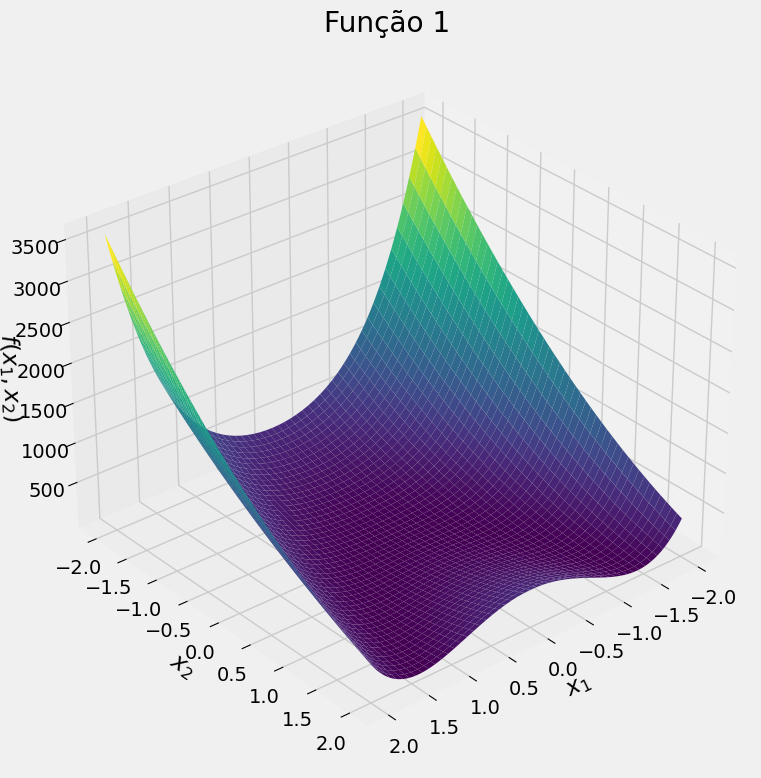

In [82]:
f_1 = lambda xk: 100*(xk[1] - xk[0]**2)**2 + (1 - xk[0])**2
f_1_grad = nd.Gradient(f_1)
f_1_hessian = nd.Hessian(f_1)
plot_function(f_1, title = 'Função 1', ndim = 3, dom = np.linspace(-2, 2, 500), angle = (30, 50))

#Função 2

\begin{aligned}
\min \quad & f(x) = \sum_{i=1}^{100} x_{i}^4 - 16x_i^2 + 5x_i \\
\text{s.a.} \quad & x \in \mathbb{R}^{100}
\end{aligned}


# Descrição da Função

Fazendo o estudo da Função no R2

$$
f(x_0, x_1) = x_0^4 - 16x_0^2 + 5x_0 + x_1^4 - 16x_1^2 + 5x_1
$$

# Cálculo do Gradiente

O gradiente de $ f(x) $ é o vetor das derivadas parciais da função em relação a $x_0$ e $x_1$. Vamos calcular as derivadas parciais:

$$
\frac{\partial f}{\partial x_0} = 4x_0^3 - 32x_0 + 5
$$

$$
\frac{\partial f}{\partial x_1} = 4x_1^3 - 32x_1 + 5
$$

Assim, o gradiente é dado por:

$$
\nabla f(x_0, x_1) = \left[ 4x_0^3 - 32x_0 + 5, \ 4x_1^3 - 32x_1 + 5 \right]
$$

# Encontrando os Pontos Críticos

Para encontrar os pontos críticos, igualamos o gradiente a zero:

$$
\begin{cases}
4x_0^3 - 32x_0 + 5 = 0 \\
4x_1^3 - 32x_1 + 5 = 0
\end{cases}
$$

Dado que as raízes da equação cúbica são conhecidas:

- Para $ x_0$  e $x_1 $, as raízes são aproximadamente: $-2.90$, $0.16$ e $2.76$.
- Assim, os pontos críticos são: $(-2.90, -2.90)$, $(0.16, 0.16)$ e $(2.76, 2.76)$.

# Cálculo da Hessiana

A matriz Hessiana é a matriz de segunda derivada da função, que nos ajuda a determinar a convexidade nos pontos críticos:

As segundas derivadas parciais são:

$$
\frac{\partial^2 f}{\partial x_0^2} = 12x_0^2 - 32
$$

$$
\frac{\partial^2 f}{\partial x_0 \partial x_1} = \frac{\partial^2 f}{\partial x_1 \partial x_0} = 0
$$

$$
\frac{\partial^2 f}{\partial x_1^2} = 12x_1^2 - 32
$$

Assim, a Hessiana é:

$$
H(x_0, x_1) = \begin{bmatrix}
12x_0^2 - 32 & 0 \\
0 & 12x_1^2 - 32
\end{bmatrix}
$$

# Análise da Convexidade nos Pontos Críticos

Vamos analisar a matriz Hessiana nos pontos críticos fornecidos:

1. **Ponto Crítico (-2.90, -2.90)**:
   
   $$ H(-2.90, -2.90) = \begin{bmatrix}
   12(-2.90)^2 - 32 & 0 \\
   0 & 12(-2.90)^2 - 32
   \end{bmatrix} $$

   Calculando:

   $$ 12(-2.90)^2 - 32 = 12 \times 8.41 - 32 \approx 100.92 - 32 = 68.92 $$

   A matriz Hessiana é:

   $$ H(-2.90, -2.90) = \begin{bmatrix}
   68.92 & 0 \\
   0 & 68.92
   \end{bmatrix} $$

   Ambos os valores são positivos, indicando que a matriz é **definida positiva**, ou seja, temos um **mínimo local** neste ponto.

2. **Ponto Crítico (0.16, 0.16)**:

   $$ H(0.16, 0.16) = \begin{bmatrix}
   12(0.16)^2 - 32 & 0 \\
   0 & 12(0.16)^2 - 32
   \end{bmatrix} $$

   Calculando:

   $$ 12(0.16)^2 - 32 = 12 \times 0.0256 - 32 \approx 0.3072 - 32 = -31.6928 $$

   A matriz Hessiana é:

   $$ H(0.16, 0.16) = \begin{bmatrix}
   -31.6928 & 0 \\
   0 & -31.6928
   \end{bmatrix} $$

   Ambos os valores são negativos, indicando que a matriz é **definida negativa**, ou seja, temos um **máximo local** neste ponto.

3. **Ponto Crítico (2.76, 2.76)**:

   $$ H(2.76, 2.76) = \begin{bmatrix}
   12(2.76)^2 - 32 & 0 \\
   0 & 12(2.76)^2 - 32
   \end{bmatrix} $$

   Calculando:

   $$ 12(2.76)^2 - 32 = 12 \times 7.6176 - 32 \approx 91.4112 - 32 = 59.4112 $$

   A matriz Hessiana é:

   $$ H(2.76, 2.76) = \begin{bmatrix}
   59.4112 & 0 \\
   0 & 59.4112
   \end{bmatrix} $$

   Ambos os valores são positivos, indicando que a matriz é **definida positiva**, ou seja, temos um **mínimo local** neste ponto.

# Conclusão

- **Pontos críticos**:
  - $(-2.90, -2.90)$: Mínimo local.
  - $(0.16, 0.16)$: Máximo local.
  - $(2.76, 2.76)$: Mínimo local.



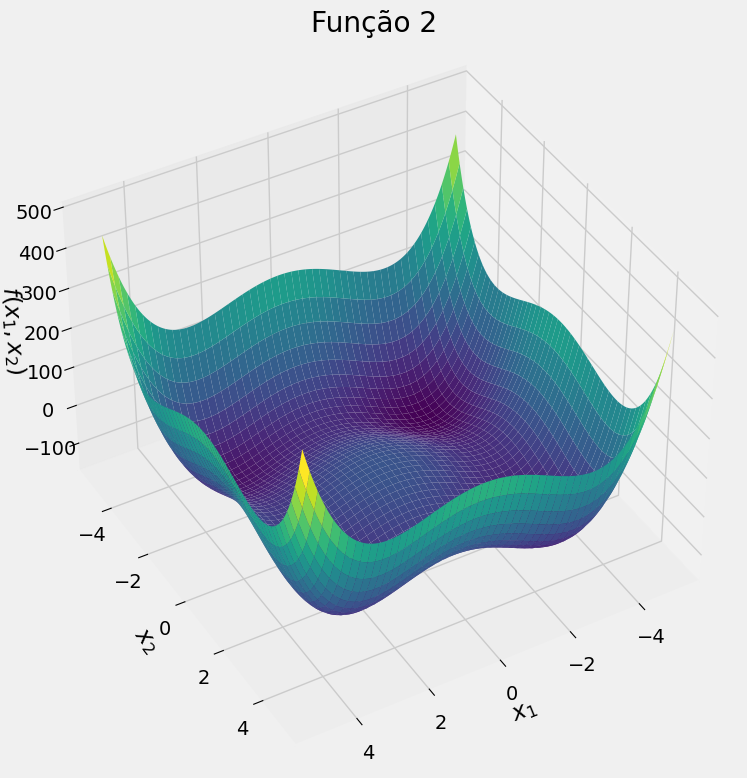

In [67]:
f_2 = lambda xk: xk[0]**4 - 16*xk[0]**2 + 5*xk[0] + xk[1]**4 - 16*xk[1]**2 + 5*xk[1]
f_2_grad = nd.Gradient(f_2)
f_2_hessian = nd.Hessian(f_2)
plot_function(f_2, title = 'Função 2', ndim = 3, angle = (40, 60))

#Função 3

\begin{aligned}
\min \quad & f(x) = (x_1^2 + x_2 - 11)^2 + (x_1 + x_2^2 - 7)^2 \\
\text{s.a.} \quad & x \in \mathbb{R}^2
\end{aligned}


# Descrição da Função
Fazendo o estudo da Função no R2

$$
f(x_0, x_1) = (x_0^2 + x_1 - 11)^2 + (x_0 + x_1^2 - 7)^2
$$

# Cálculo do Gradiente
O gradiente de $f(x_0, x_1)$ é o vetor das derivadas parciais da função em relação a $x_0$ e $x_1$. Vamos calcular as derivadas parciais:

## Derivada parcial em relação a $x_0$:
$$
\frac{\partial f}{\partial x_0} = 4x_0(x_0^2 + x_1 - 11) + 2(x_0 + x_1^2 - 7)
$$

## Derivada parcial em relação a $x_1$:
$$
\frac{\partial f}{\partial x_1} = 2(x_0^2 + x_1 - 11) + 4x_1(x_0 + x_1^2 - 7)
$$

Assim, o gradiente é dado por:

$$
\nabla f(x_0, x_1) = \left[ 4x_0(x_0^2 + x_1 - 11) + 2(x_0 + x_1^2 - 7), \, 2(x_0^2 + x_1 - 11) + 4x_1(x_0 + x_1^2 - 7) \right]
$$

# Encontrando os Pontos Críticos
Para encontrar os pontos críticos, igualamos o gradiente a zero:

$$
\begin{cases}
4x_0(x_0^2 + x_1 - 11) + 2(x_0 + x_1^2 - 7) = 0 \\
2(x_0^2 + x_1 - 11) + 4x_1(x_0 + x_1^2 - 7) = 0
\end{cases}
$$

Resolvendo esse sistema, encontramos como solução $(3, 2)$.

# Cálculo da Hessiana
A matriz Hessiana é a matriz de segunda derivada da função, que nos ajuda a determinar a convexidade nos pontos críticos.

As segundas derivadas parciais são:

## Derivada de $\frac{\partial f}{\partial x_0}$ em relação a $x_0$:
$$
\frac{\partial^2 f}{\partial x_0^2} = 4(x_0^2 + x_1 - 11) + 8x_0^2 + 2
$$

## Derivada de $\frac{\partial f}{\partial x_0}$ em relação a $x_1$:
$$
\frac{\partial^2 f}{\partial x_0 \partial x_1} = 4x_0 + 0 + 4x_1
$$

## Derivada de $\frac{\partial f}{\partial x_1}$ em relação a $x_1$:
$$
\frac{\partial^2 f}{\partial x_1^2} = 2 + 4(x_0 + x_1^2 - 7) + 8x_1^2
$$

## Derivada de $\frac{\partial f}{\partial x_1}$ em relação a $x_0$:
$$
\frac{\partial^2 f}{\partial x_1 \partial x_0} = 4x_0 + 0 + 4x_1
$$

Assim, a matriz Hessiana é:

$$
H(x_0, x_1) = \begin{bmatrix}
4(x_0^2 + x_1 - 11) + 8x_0^2 + 2 & 4x_0 + 4x_1 \\
4x_0 + 4x_1 & 2 + 4(x_0 + x_1^2 - 7) + 8x_1^2
\end{bmatrix}
$$

# Análise da Convexidade no Ponto Crítico $(3, 2)$
Agora, vamos analisar a matriz Hessiana no ponto crítico $(3, 2)$.

Substituindo $x_0 = 3$ e $x_1 = 2$ na matriz Hessiana:

## Primeiro elemento (derivada segunda de $f$ em relação a $x_0$):
$$
\frac{\partial^2 f}{\partial x_0^2} = 4(3^2 + 2 - 11) + 8(3^2) + 2 = 4(9 + 2 - 11) + 8(9) + 2 = 4(0) + 72 + 2 = 74
$$

## Segundo elemento (derivada mista de $f$ em relação a $x_0$ e $x_1$):
$$
\frac{\partial^2 f}{\partial x_0 \partial x_1} = 4(3) + 4(2) = 12 + 8 = 20
$$

## Terceiro elemento (derivada mista de $f$ em relação a $x_1$ e $x_0$):
$$
\frac{\partial^2 f}{\partial x_1 \partial x_0} = 4(3) + 4(2) = 12 + 8 = 20
$$

## Quarto elemento (derivada segunda de $f$ em relação a $x_1$):
$$
\frac{\partial^2 f}{\partial x_1^2} = 2 + 4(3 + 2^2 - 7) + 8(2^2) = 2 + 4(3 + 4 - 7) + 8(4) = 2 + 4(0) + 32 = 34
$$

Logo, a matriz Hessiana no ponto $(3, 2)$ é:

$$
H(3, 2) = \begin{bmatrix}
74 & 20 \\
20 & 34
\end{bmatrix}
$$

Para determinar a natureza da matriz, precisamos verificar a condição de definitude positiva:

O determinante da Hessiana é:

$$
\text{det}(H(3, 2)) = (74)(34) - (20)(20) = 2516 - 400 = 2116
$$

Como o determinante é positivo e o elemento da diagonal principal (74) também é positivo, a matriz é definida positiva.

Portanto, o ponto crítico $(3, 2)$ é um mínimo local.

# Conclusão
O ponto crítico $(3, 2)$ é um mínimo local.


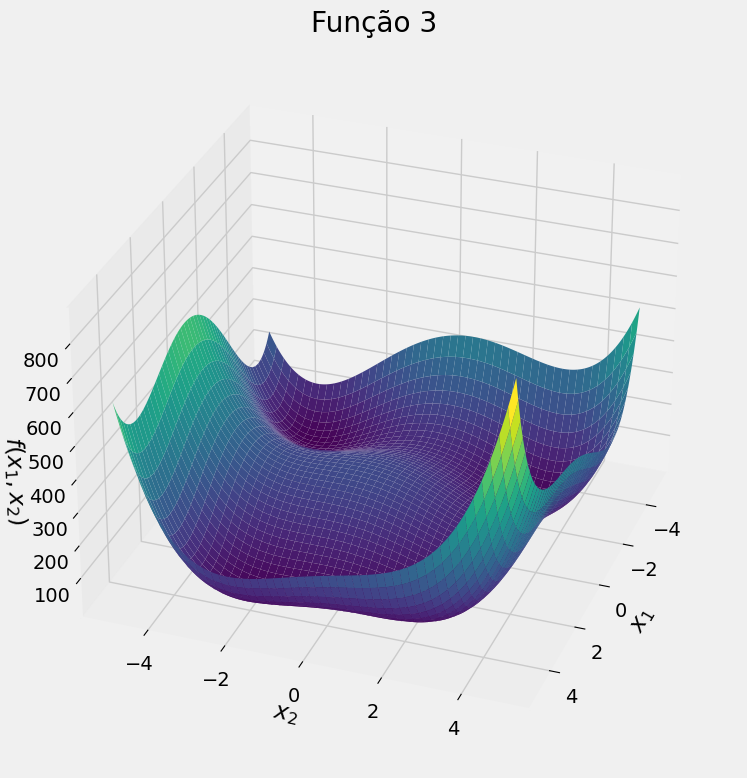

In [68]:
f_3 = lambda xk: ((xk[0])**2 + xk[1] - 11)**2 + (xk[0] + (xk[1])**2 - 7)**2
f_3_grad = nd.Gradient(f_3)
f_3_hessian = nd.Hessian(f_3)
plot_function(f_3, title = 'Função 3', ndim = 3, angle = (30, 20))

# Algorítmos
## Busca de Armijo
### A Condição de Armijo:
$$
f(x_k + \lambda_k d_k) < f(x_k) + \eta \lambda_k \nabla^T f(x_k) d_k
$$


 $x_k \equiv \text{chute inicial (initial guess)}$

 $\eta  \in (0, 1) \equiv \text{constante de decréscimo}$

 $\lambda_{k} > 0 \equiv \text{passo na iteração } k$

 $\nabla^{T}{f(x_{k})}\,d_{k} < 0 \equiv \text{direção de descida em } x_{k}$


## Algoritmo

---

Dada uma direção de descida $d_{k}$

1. Começar com $\gamma = 0.5$ fixo e  $\lambda = 1$;
   
2. Se a inequação for satisfeita: Fazer $\lambda_k = \lambda$ e $x^{k+1} = x^{k} + \lambda_{k}d_{k}$;

3. Caso contrário: Atualizar o valor de ${\lambda}$. Fazer $\lambda = \gamma \cdot \lambda$ e ir para o Passo 2;

Processo conhecido como backtracking.

---

Importante ressaltar que $\gamma$ é uma constante em que $\gamma \in (0, 1)$.

$$
$$Abaixo está a implementação do Algoritmo.
$$
$$




In [69]:
def Armijo_Search(f, xk, dk, eta = 0.02, gamma = 0.5):

  '''
    Busca linear com Condição de Armijo (1° Condição de Wolfe) - Desigualdade 1, que consiste em fazer um decréscimo da f proporcional ao tamanho do passo

    Parâmetros
    ----------------------------------------
    f : callable
        Função objetivo (função custo).
    xk : array
        Ponto atual.
    dk : array
        Direção de descida (grad_T(f(x_{k})) . d_{k}  < 0).
    eta : float, opcional
        Valor de eta entre (0, 1) - constante de decréscimo. Padrão = 0.02
    gamma : float, opcional
        Valor de gamma entre (0, 1). Padrão = 0.5

    Saída
    ----------------------------------------
    lambda : float
        Valor de lambda que satisfaz a condição de Armijo.
    f_x0 : float
        Valor de f no ponto x_{k+1}.
    iteracao : int
        Número de iterações realizadas.
  '''

  #iteração
  iteracao = 0

  # Começa constante lambda = 1

  lambda_ = 1

  # Direção de descida d = grad_{T}(f(x_{k})) . dk < 0
  desc_direction = np.dot(nd.Gradient(f)(xk), dk)

  f_x0 = f(xk + lambda_ * dk)

  # Calcula a função em um ponto menor que x_k com passo inicial lambda = 1
  # Condição de Armijo para determinar o tamanho do passo, diminuindo a função custo
  while (f_x0 > f(xk) + eta * lambda_ * desc_direction):

    lambda_ = gamma * lambda_
    f_x0 = f(xk + lambda_ * dk)
    iteracao += 1

  # Retorna o passo lambda e o valor da função
  return lambda_, f_x0, iteracao

#Método do Gradiente com Busca de Armijo
$$$$
##O método consiste em se obter uma direção $d_k$ tal que $d_k = - \nabla f(\vec{x})$ e a partir disso calcular o novo ponto $x_{k+1}$ em que a norma do gradiente $\lVert \nabla f(x_{k+1}) \rVert$ seja menor e o custo da função $f(x_{k+1})$ diminua. O algoritmo esquematizado está abaixo:
$$$$

Dado um ponto $x_{0} \in \Re^{n}$ ($\textit{initial guess}$) e para $\nabla f(x_{k}) \neq 0$, realizar os seguintes passos:
1. Calcular a direção de descida $d_{k} = - \nabla f(x_{0})$;
2. Realizar Busca de Armijo e encontrar um $\lambda_k$ que satisfaça a desigualdade de armijo;
3. Calcular o novo ponto $x_{k+1} = x_{k} + \lambda_{k} d_{k} = x_{k} - \lambda_{k} \nabla f(x_{k})$;


#Algorítmo - Método do Gradiente

In [70]:
def GradientDescent(f, f_grad, chute, eta = 0.02, tol=1e-8):

  """Algoritmo de Descida do Gradiente com busca linear com condição de Armijo. Esquema:

      I - Direção de descida: d_k := −∇f(x).
      II - Determinação do passo com busca de Armijo.
      III - Obtém o próximo candidato.

      Parâmetros
      --------------------
      f : callable
          Função custo
      f_grad : callable
          Gradiente da função f
      chute : array
          Valor inicial de x ("chute")
      eta : float, opcional
          Constante de Decréscimo de Armijo. Padrão = 0.02
      tol : float, opcional
          Tolerância padrão de 1e-8

      Saída
      --------------------
      xk : array
          valores de xk
      yk : array
          valores da função custo em cada xk
      grad_f : array
          valores da norma do gradiente da f em xk
      iteracoesArmijo: int
          numero de iterações de armijo

      """


  # Valores iniciais de xk, fk e grad_fk
  xk = chute
  fk = f(xk)
  grad_fk = f_grad(xk)
  grad_fk_norm = np.linalg.norm(grad_fk)
  max_iter = 500

  # Inicializa o número de iterações e a lista para fazer os plots dos valores de x e y
  iteracoesArmijo = 0
  num_iter = 0
  x_pontos = [xk]
  y_pontos = [fk]
  grad_f = [grad_fk_norm]
  print(f'Chute inicial: y = {fk}, x = {xk} \n')

  # Calcula nova iteração com busca de Armijo
  while (grad_fk_norm > tol and num_iter < max_iter):

    # Determina a direção
    pk = -grad_fk

    if (np.linalg.norm(f(xk)) > 1e16) or (grad_fk_norm > 1e16):
      print("\nErro: Overflow\n")
      break

    # Faz a busca de Armijo, obtendo o passo lambda e a função custo naquele passo
    lambda_, fk, iArmijo = Armijo_Search(f, xk, pk, eta)
    iteracoesArmijo += iArmijo

    # calcula x_{k+1}
    xk = xk + lambda_ * pk
    grad_fk = f_grad(xk)
    grad_fk_norm = np.linalg.norm(grad_fk)

    # Itera mais uma vez
    num_iter += 1
    x_pontos.append(xk)
    y_pontos.append(fk)
    grad_f.append(grad_fk_norm)

  # print results
  if num_iter == max_iter:
    print('\nNúmero de iterações máximo atingido.\n')

  return np.array(x_pontos), np.array(y_pontos), np.array(grad_f), iteracoesArmijo

# Testes
## Método de Descida do Gradiente com busca linear de Armijo.
### Nesta parte testaremos o nosso algorítmo nas funções fornecidas.


1.   Função 1
2.   Função 2
3.   Função 3



#Função 1

Chute inicial: y = 0, x = [1, 1] 



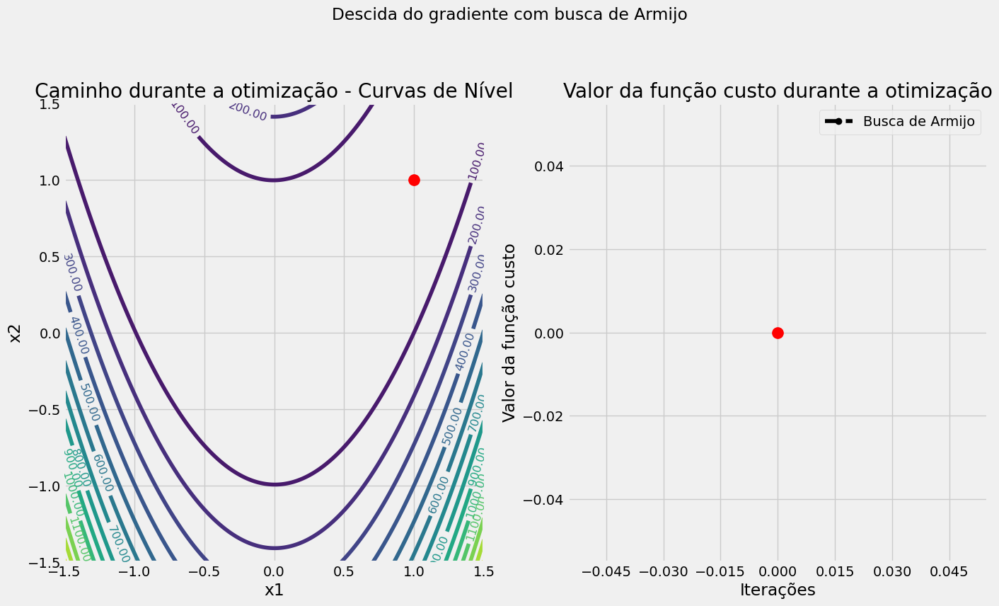

Chute inicial: y = 2.5999999999999974, x = [0.8, 0.8] 


Número de iterações máximo atingido.



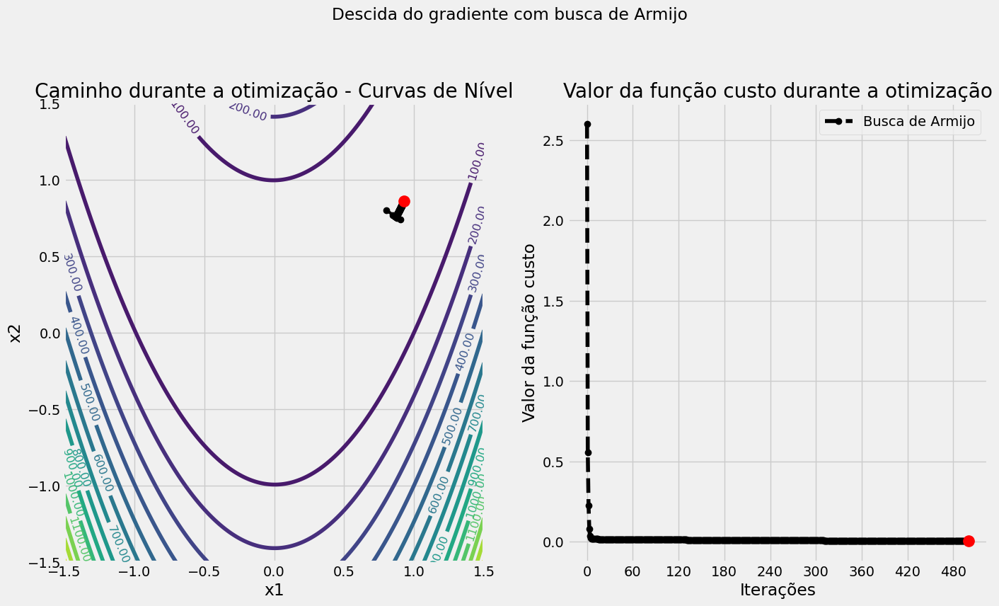

Chute inicial: y = 6.5, x = [0.5, 0.5] 


Número de iterações máximo atingido.



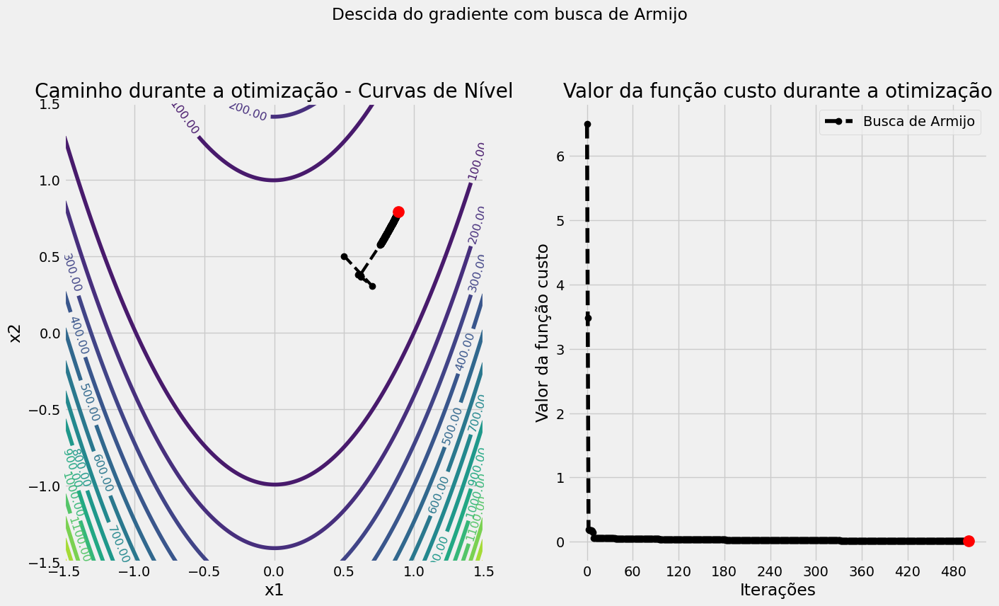

Chute inicial: y = 1, x = [0, 0] 


Número de iterações máximo atingido.



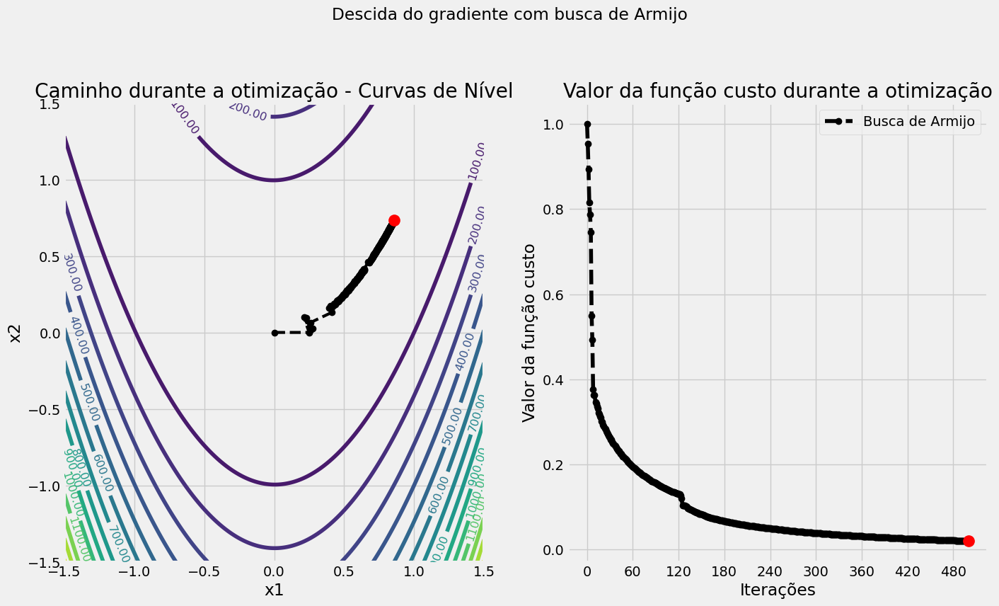

Chute inicial: y = 13.220000000000002, x = [-0.9, 0.5] 


Número de iterações máximo atingido.



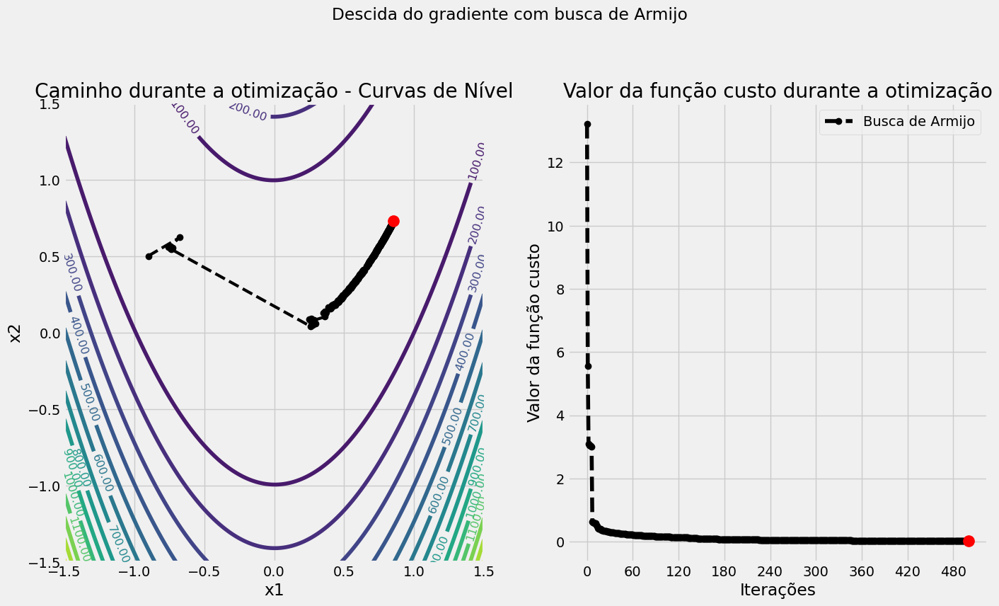

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[1, 1]",1,0,"[1, 1]",0.00000000,0.00000000
1,"[0.8, 0.8]",501,4343,"[0.92806535, 0.86116176]",0.00517665,0.09502292
2,"[0.5, 0.5]",501,4231,"[0.88991696, 0.79192709]",0.01211834,0.21128642
3,"[0, 0]",501,4069,"[0.85695535, 0.7346017]",0.02046703,0.36753625
4,"[-0.9, 0.5]",501,4054,"[0.85340312, 0.72830143]",0.02149065,0.29474545


In [71]:
chutes = [[1, 1], [0.8, 0.8], [0.5, 0.5], [0, 0], [-0.9, 0.5]]
resultados_finais_df = processa_chutes(chutes, f_1, f_1_grad,method='1',range=np.linspace(-1.5, 1.5, 500))
display(resultados_finais_df)

#Função 2


Chute inicial: y = -156.6638, x = [-2.9, -2.9] 


Número de iterações máximo atingido.



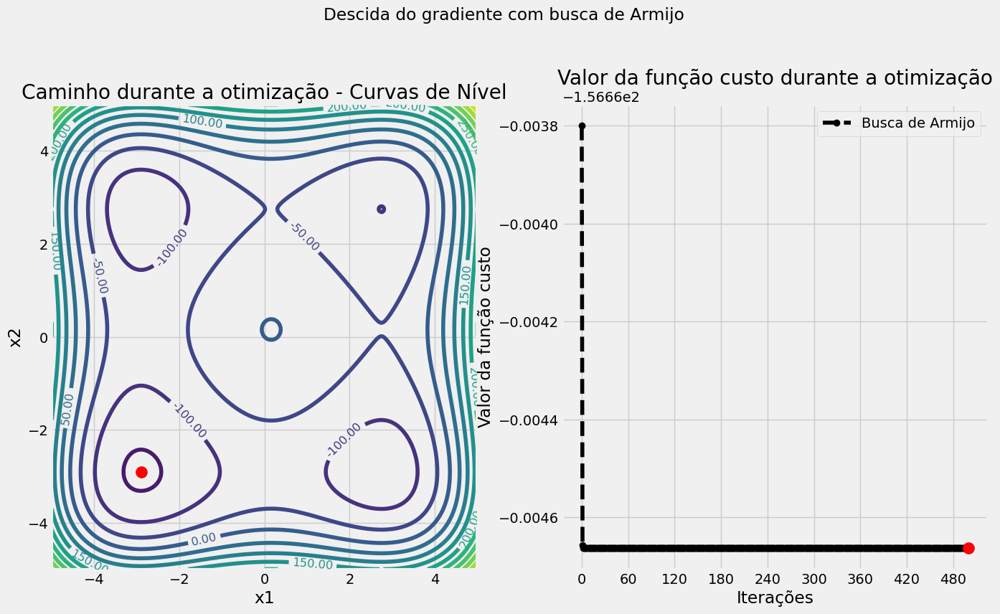

Chute inicial: y = -100.10754048, x = [2.76, 2.76] 


Número de iterações máximo atingido.



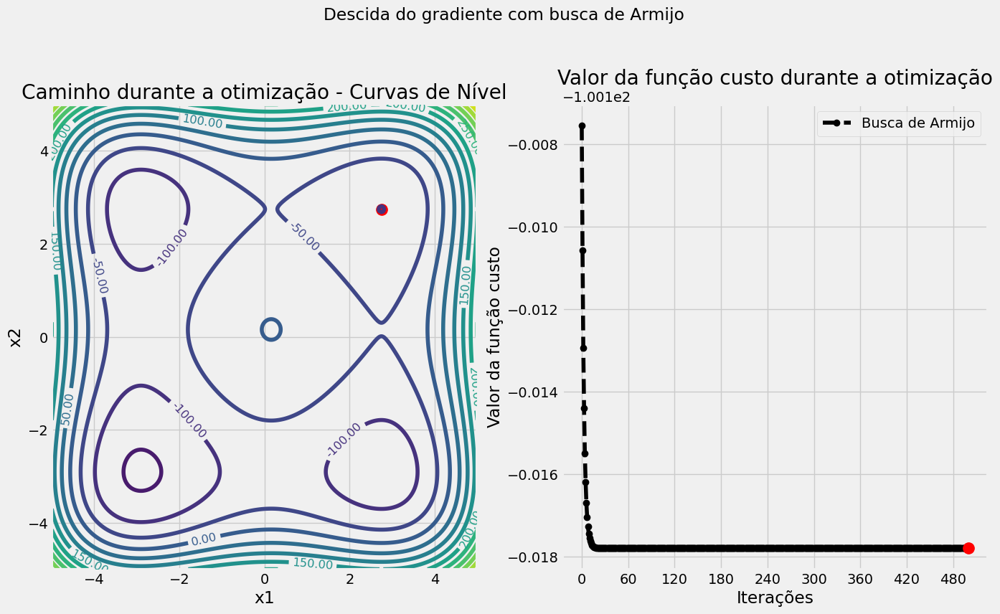

Chute inicial: y = 40, x = [4, 4] 


Número de iterações máximo atingido.



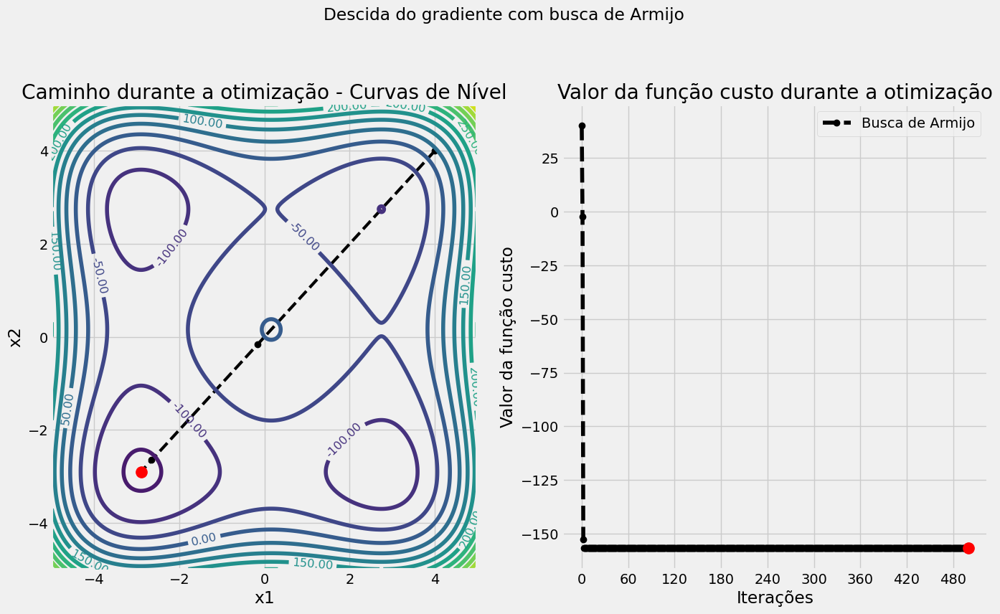

Chute inicial: y = 0, x = [0, 0] 


Número de iterações máximo atingido.



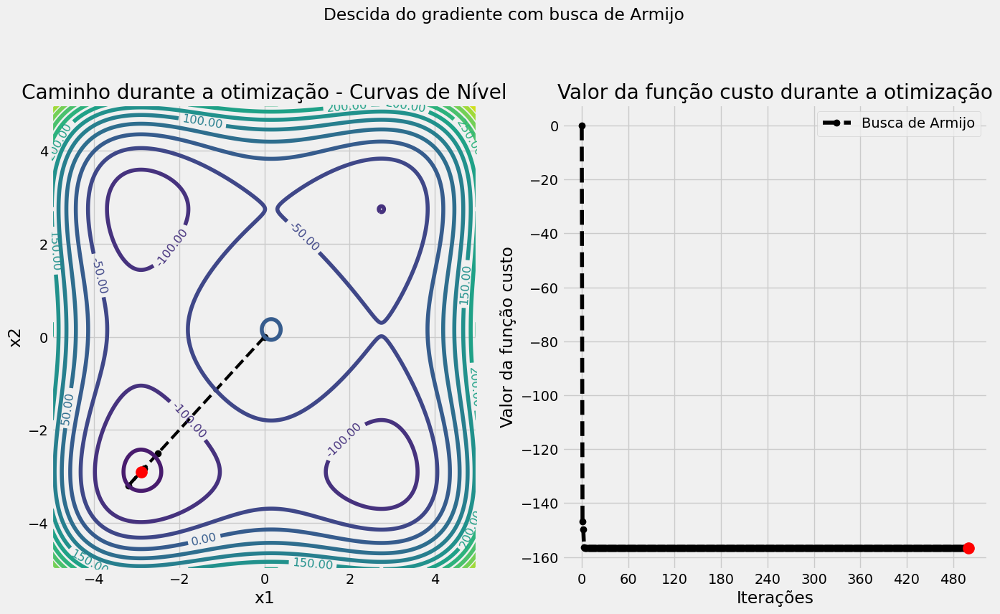

Chute inicial: y = -76, x = [2, 2] 


Número de iterações máximo atingido.



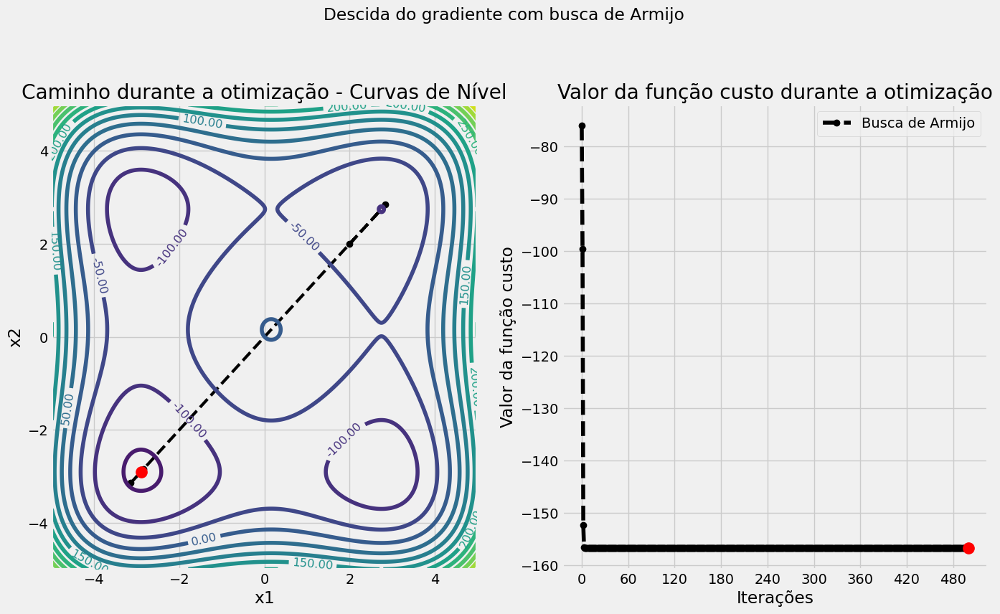

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[-2.9, -2.9]",501,10920,"[-2.90353403, -2.90353403]",-156.66466282,0.00000000
1,"[2.76, 2.76]",501,11951,"[2.74680277, 2.74680277]",-100.11778662,0.00000006
2,"[4, 4]",501,13130,"[-2.90353403, -2.90353403]",-156.66466282,0.00000003
3,"[0, 0]",501,16195,"[-2.90353401, -2.90353401]",-156.66466282,0.00000139
4,"[2, 2]",501,12538,"[-2.90353403, -2.90353403]",-156.66466282,0.00000002


In [72]:
chutes = [[-2.9, -2.9], [2.76, 2.76], [4, 4], [0, 0], [2, 2]]
resultados_finais_df = processa_chutes(chutes, f_2, f_2_grad, method='1',range=np.linspace(-5, 5, 500))
display(resultados_finais_df)

#Função 3

Chute inicial: y = 0, x = [3, 2] 



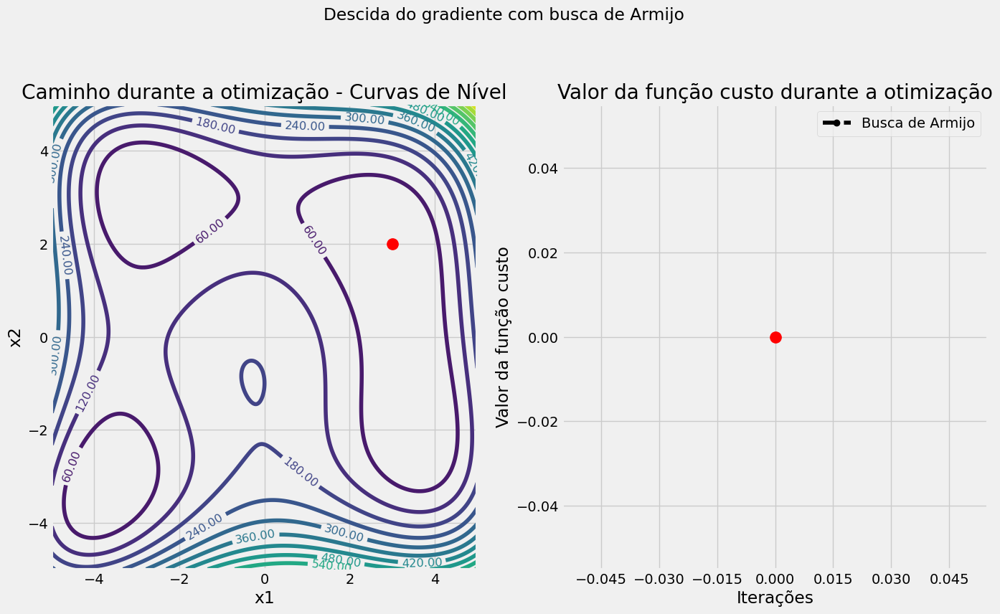

Chute inicial: y = 136, x = [1, 4] 



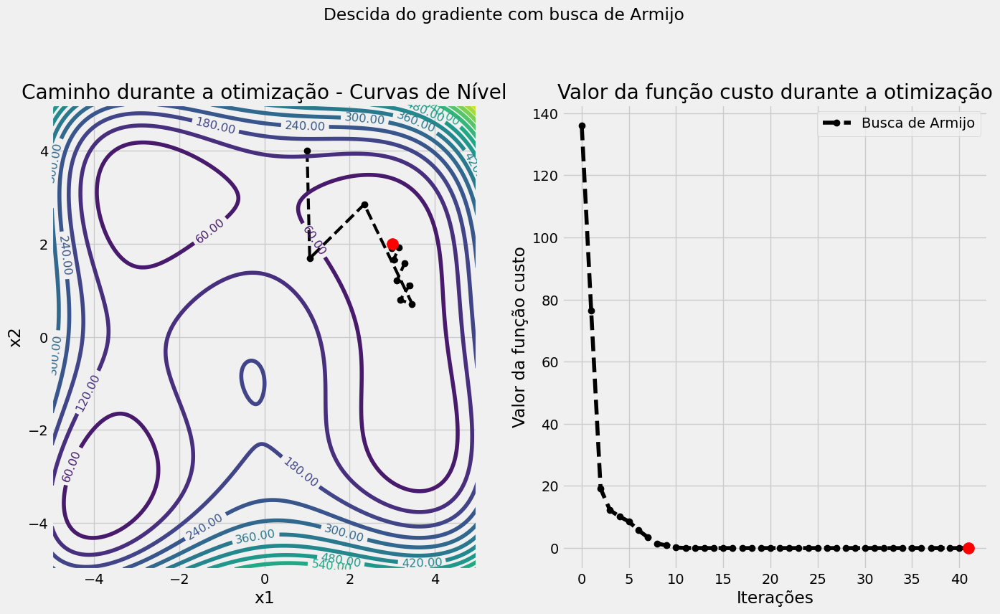

Chute inicial: y = 180, x = [3, -4] 



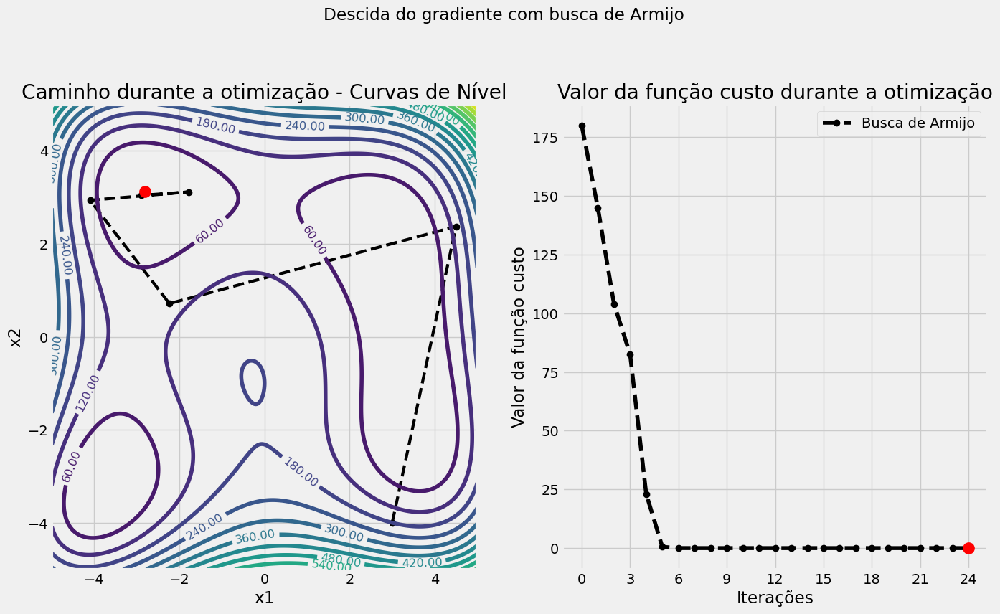

Chute inicial: y = 170, x = [0, 0] 



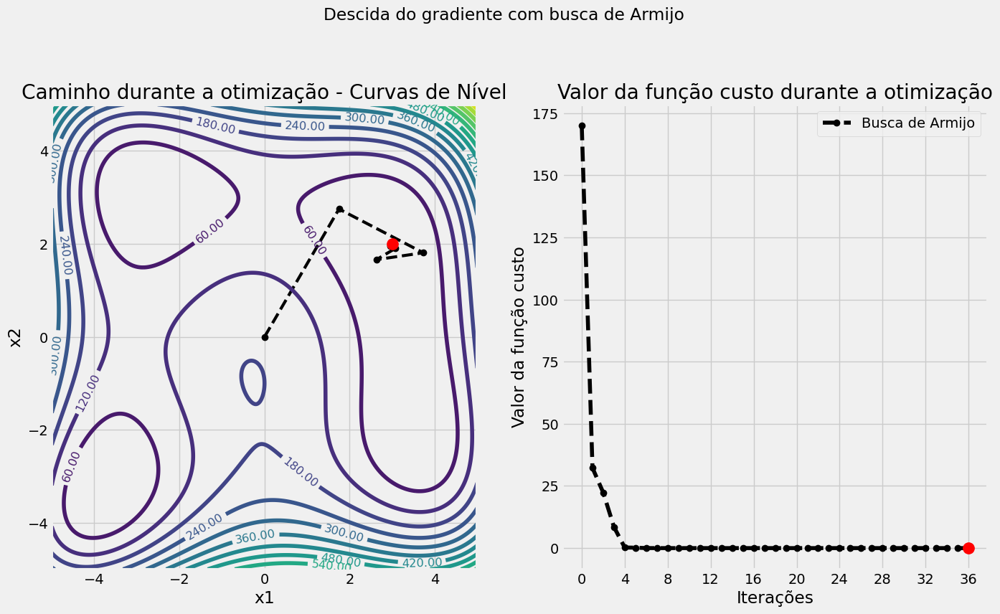

Chute inicial: y = 26, x = [3, 3] 



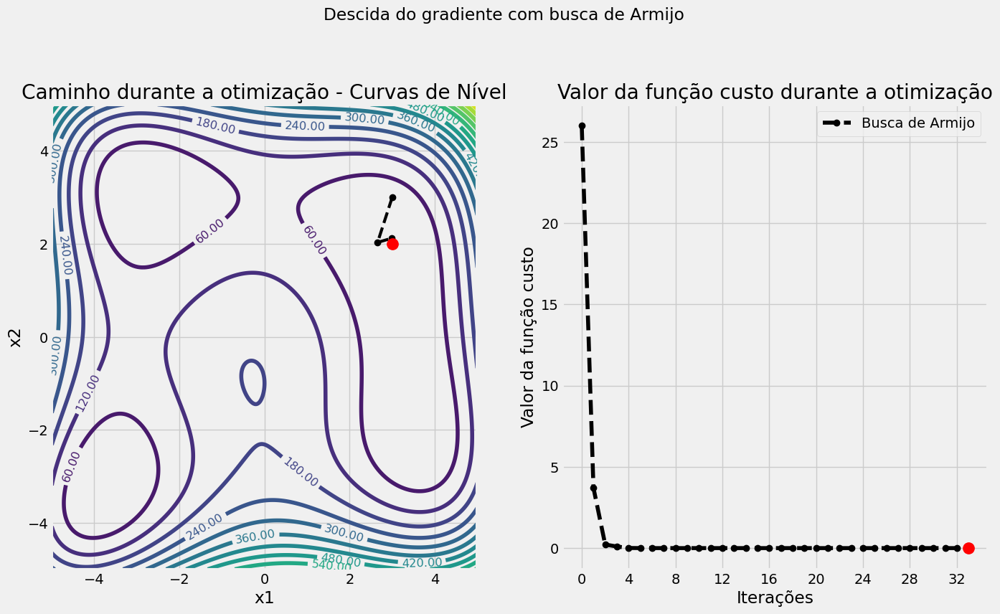

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[3, 2]",1,0,"[3, 2]",0.00000000,0.00000000
1,"[1, 4]",42,232,"[3.0, 2.0]",0.00000000,0.00000000
2,"[3, -4]",25,139,"[-2.80511809, 3.13131252]",0.00000000,0.00000000
3,"[0, 0]",37,202,"[3.0, 2.0]",0.00000000,0.00000000
4,"[3, 3]",34,190,"[3.0, 2.0]",0.00000000,0.00000000


In [73]:
chutes = [[3, 2], [1, 4], [3, -4], [0, 0], [3, 3]]
resultados_finais_df = processa_chutes(chutes, f_3, f_3_grad, method='1',range=np.linspace(-5,5, 500))
display(resultados_finais_df)

#Método de Newton com Busca de Armijo

O Método de Newton, diferentemente do método apresentado acima, consiste em se obter uma direção $d_k$ tal que:
\begin{equation}
d_k = - (\nabla^{2}f(\vec{x}))^{-1} \cdot \nabla f(\vec{x})
\end{equation}

A Hessiana $\nabla^{2}f(x_{k})$ pode ser não definida positiva longe do ponto. Acontecendo isso, utilizaremos a direção do Método do Gradiente como direção de descida.
E então calculamos o novo ponto $x_{k+1}$ em que a norma do gradiente $\lVert \nabla f(x_{k+1}) \rVert$ seja menor e o custo da função $f(x_{k+1})$ diminua.

$$$$
# Algoritmo

Dado um ponto  $x_0 \in \mathbb{R}^n$  (initial guess), para  $\nabla f(x_k) \neq 0$  e  $\nabla^2 f(x_k)$  matriz não singular, realizar os seguintes passos:

1. Calcular a direção de descida  $d_k$  resolvendo o sistema  $\nabla^2 f(x_k) d_k = -\nabla f(x_k)$ ;
2. Verificar se  $d_k^T \nabla f(x_k) \leq -0.001 \| d_k \| \| \nabla f(x_k) \|$ . Se não for satisfeita, usar  $d_k = -\nabla f(x_k)$  (Método do Gradiente);
3. Realizar Busca de Armijo e encontrar um  $\lambda_k$  
4. Calcular o novo ponto  $x_{k+1} = x_k + \lambda_k d_k$ .

#Algorítmo - Método de Newton

In [74]:
def Newton(f, f_grad, f_hessian, chute, eta = 0.02, tol=1e-8):

  """
        Parâmetros
        --------------------
        f : callable
            Função custo
        f_grad : callable
            Gradiente da função f
        f_hessian : callable
            Hessiana da função f
        chute : array
            Valor inicial de x ("chute")
        eta : float, opcional
            Constante de Decréscimo de Armijo. Padrão = 0.02
        tol : float, opcional
            Tolerância desejada. Padrão = 1e-8

        Saída
        --------------------
        xk : array
            valores de xk
        yk : array
            valores da função custo e cada xk
        grad_f : array
            valores da norma do gradiente da f em xk"""

  # Valores iniciais de xk, fk, grad_fk e max_iter
  xk = chute
  fk = f(xk)
  grad_fk = f_grad(xk)
  grad_fk_norm = np.linalg.norm(grad_fk)
  max_iter = 500

  # Inicializa o número de iterações e a lista para fazer os plots dos valores de x e y
  iteracoesArmijo = 0
  num_iter = 0
  x_pontos = [xk]
  y_pontos = [fk]
  grad_f = [grad_fk_norm]

  f_hessian_xk = f_hessian(xk)
  print(f'Chute inicial: y = {fk}, x = {xk} \n')

  # Calcula nova iteração com busca de Armijo
  while (grad_fk_norm > tol and num_iter < max_iter):

    f_hessian_xk = f_hessian(xk)

    if (np.linalg.norm(f(xk)) > 1e16) or (grad_fk_norm > 1e16)  or  (np.linalg.norm(f_hessian_xk) > 1e16):
      print("\nErro: Overflow\n")
      break

    # Não invertível
    if abs(np.linalg.det(f_hessian_xk)) <= 1e-3:
      break

    # Determina a direção resolvendo o sistema:  \nabla^{2} f(x_{k}) . p_{k} = - \nabla f(x_{k})
    pk = -np.linalg.solve(f_hessian_xk, grad_fk)
    lambda_ = 1

    # Se estiver longe do ponto, a matriz Hessiana pode ser não definida positiva.
    # Se isso acontecer, seguiremos pelo Método do Gradiente:
    if not (np.dot(pk, grad_fk) < (-0.001 * np.linalg.norm(f_grad(xk)) * np.linalg.norm(pk))):

      # Descida do gradiente
      pk = -f_grad(xk)

      # Faz a busca de Armijo, obtendo o passo lambda e a função custo naquele passo
      lambda_, fk, iArmijo = Armijo_Search(f, xk, pk, eta=eta)
      iteracoesArmijo += iArmijo

    else:
      lambda_, fk, iArmijo = Armijo_Search(f, xk, pk, eta=eta)
      iteracoesArmijo += iArmijo

    # calcula x_{k+1}
    xk = xk + lambda_ * pk
    grad_fk = f_grad(xk)
    grad_fk_norm = np.linalg.norm(grad_fk)

    # Itera mais uma vez
    num_iter += 1
    x_pontos.append(xk)
    y_pontos.append(f(xk))
    grad_f.append(grad_fk_norm)

    # número máximo de iterações
    if num_iter == max_iter:
      print('\nNúmero máximo de iterações atingido.\n')
      break

  if abs(np.linalg.det(f_hessian_xk)) <= 1e-3:
    print("\nMatriz Hessiana não invertível. Mudar o ponto inicial.\n")
    return [], [], []

  elif np.min(np.linalg.eigvals(f_hessian_xk)) <= 1e-3:
    print("\nMatriz Hessiana não positiva definida. Mudar o ponto inicial. Ponto de sela encontrado.\n")


  return np.array(x_pontos), np.array(y_pontos), np.array(grad_f), iteracoesArmijo

#Testes - (Método de Newton)
##Nesta parte algumas funções exemplo serão testadas utilizando o Método de Newton com busca linear de Armijo, como os exemplos 3, 4 e 5 do Método de Descida do Gradiente.


#Função 1


Chute inicial: y = 0, x = [1, 1] 



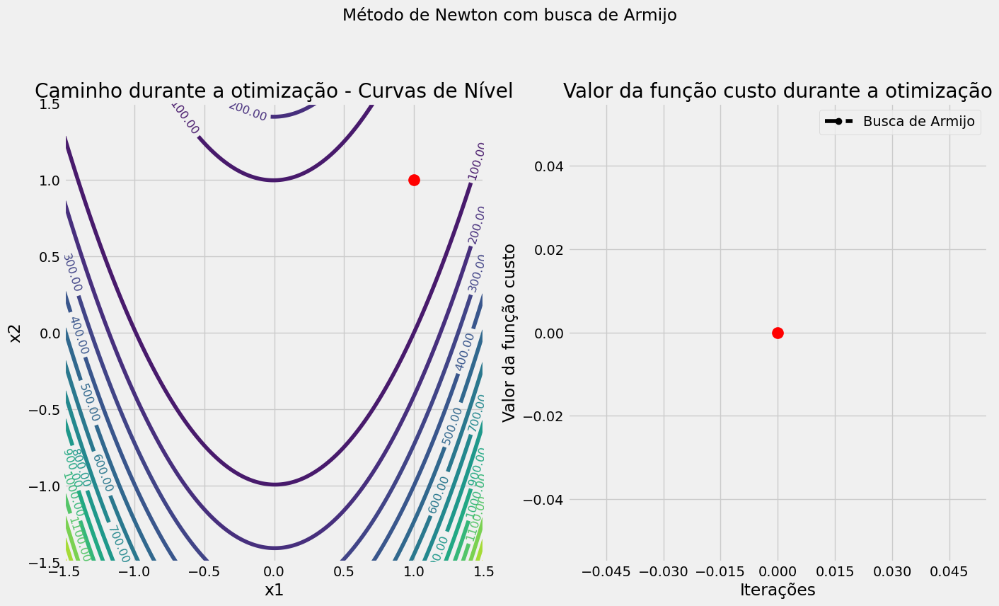

Chute inicial: y = 2.5999999999999974, x = [0.8, 0.8] 



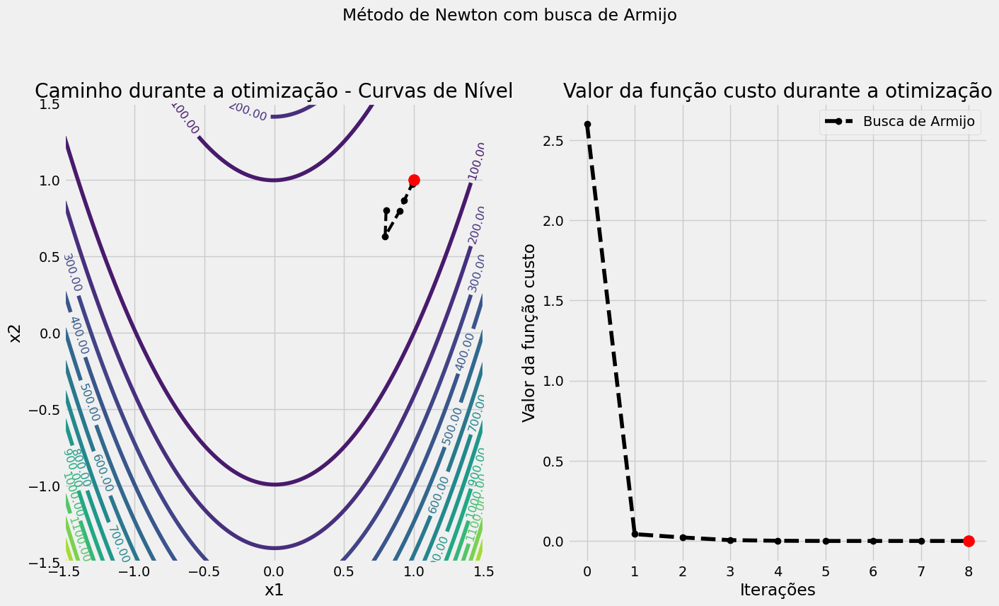

Chute inicial: y = 6.5, x = [0.5, 0.5] 



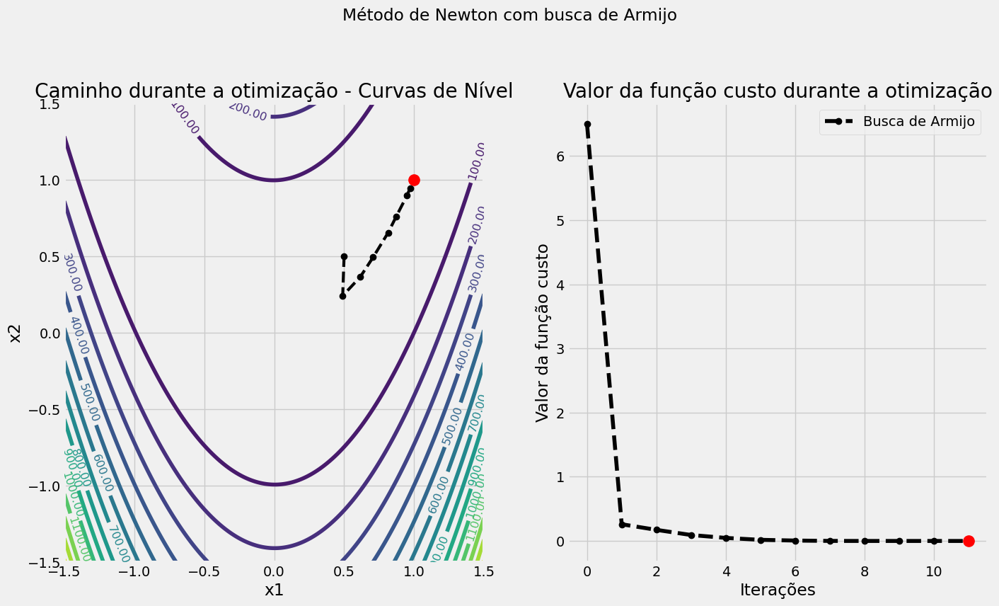

Chute inicial: y = 1, x = [0, 0] 



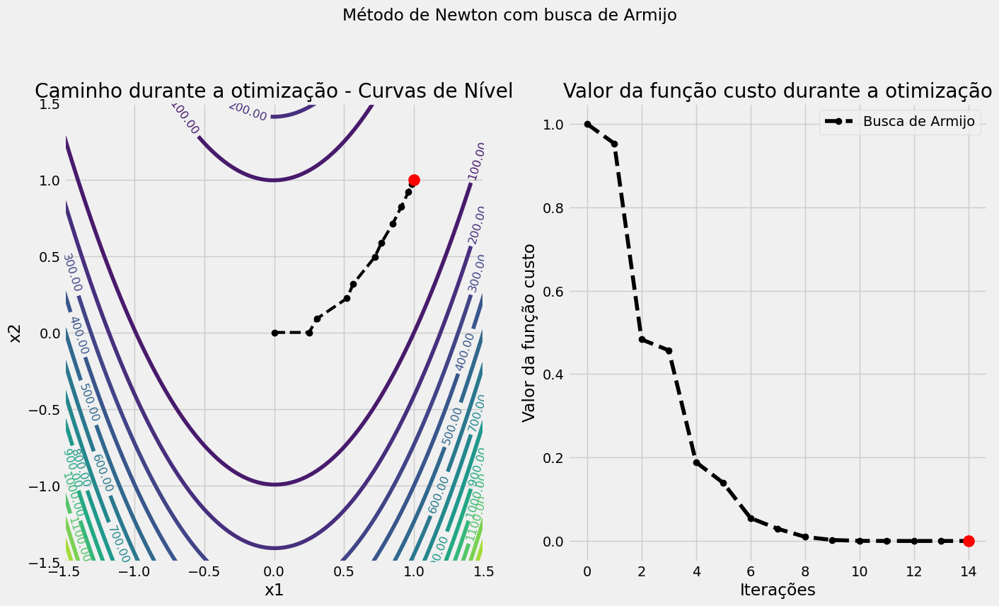

Chute inicial: y = 13.220000000000002, x = [-0.9, 0.5] 



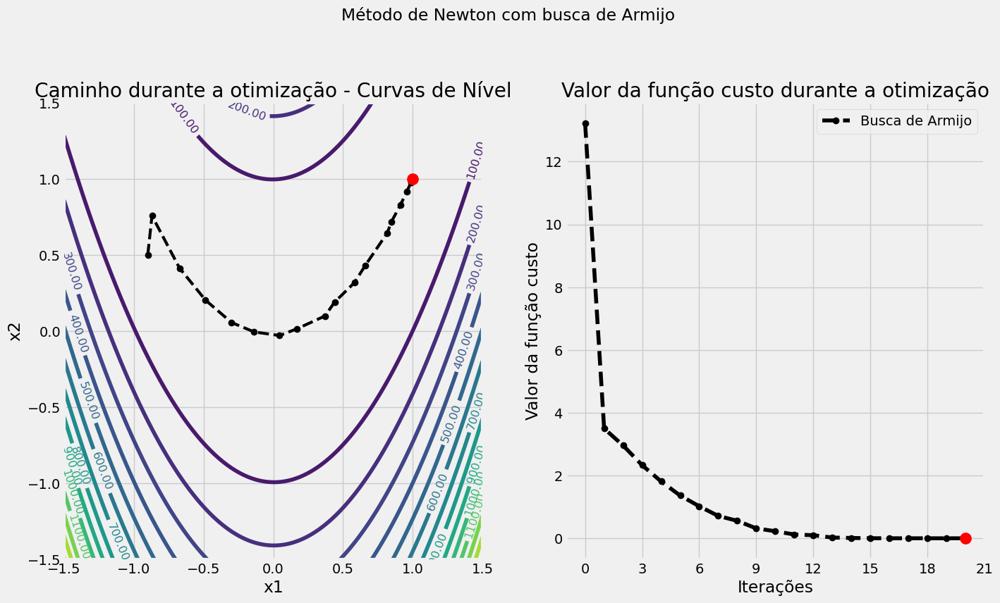

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[1, 1]",1,0,"[1, 1]",0.00000000,0.00000000
1,"[0.8, 0.8]",9,1,"[1.0, 1.0]",0.00000000,0.00000000
2,"[0.5, 0.5]",12,2,"[1.0, 1.0]",0.00000000,0.00000000
3,"[0, 0]",15,5,"[1.0, 1.0]",0.00000000,0.00000000
4,"[-0.9, 0.5]",21,5,"[1.0, 1.0]",0.00000000,0.00000000


In [75]:
chutes = [[1, 1], [0.8, 0.8], [0.5, 0.5], [0, 0], [-0.9, 0.5]]
resultados_finais_df = processa_chutes(chutes, f_1, f_1_grad,method='2',range=np.linspace(-1.5, 1.5, 500))
display(resultados_finais_df)

#Função 2


Chute inicial: y = -156.6638, x = [-2.9, -2.9] 



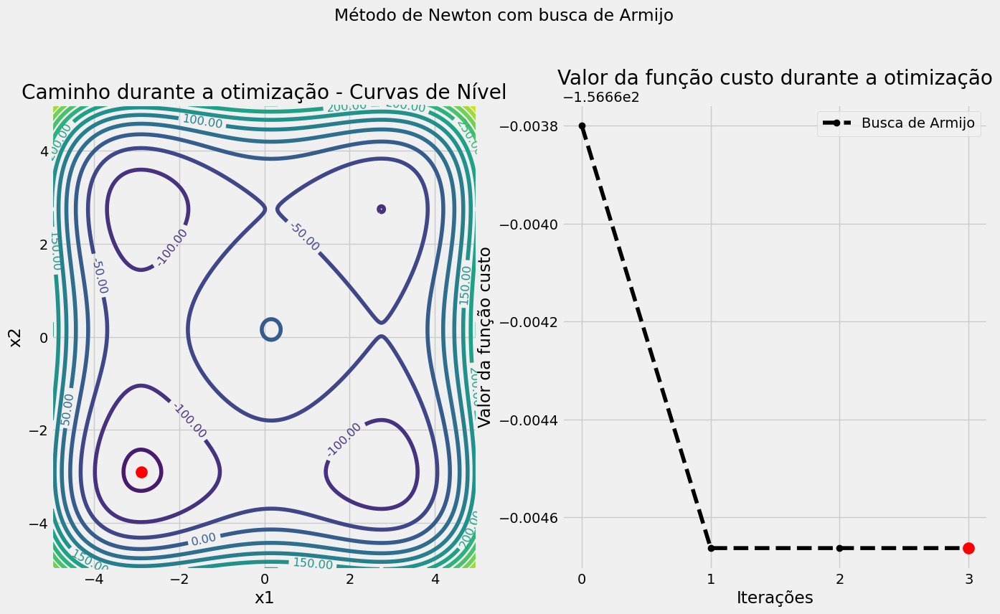

Chute inicial: y = -100.10754048, x = [2.76, 2.76] 



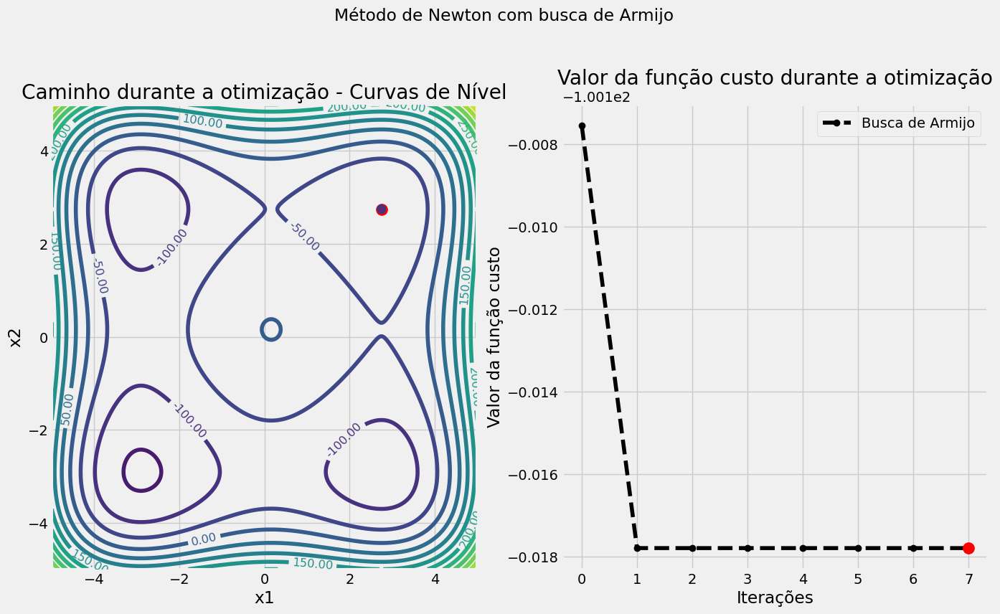

Chute inicial: y = 40, x = [4, 4] 



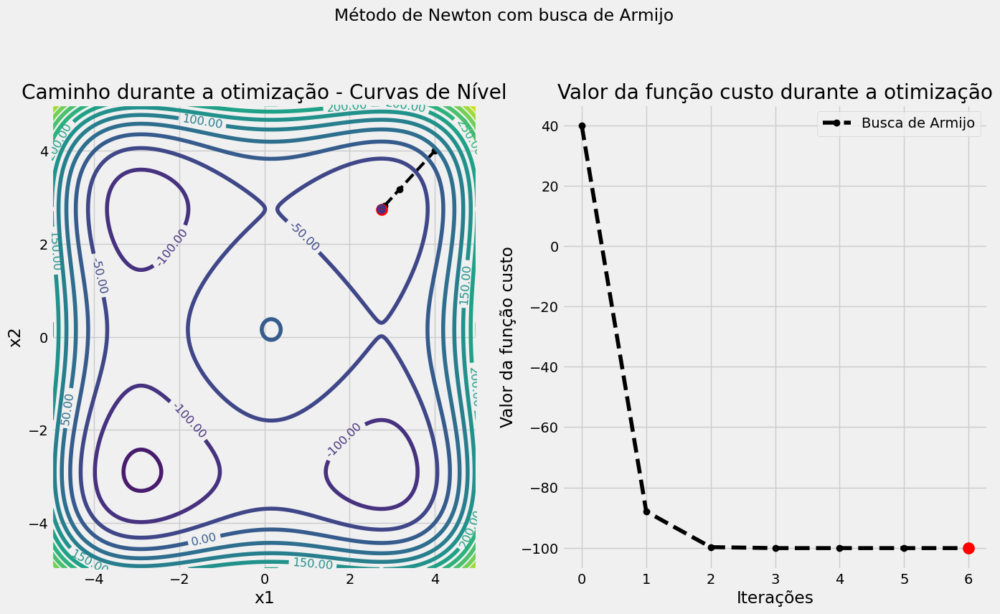

Chute inicial: y = 0, x = [0, 0] 



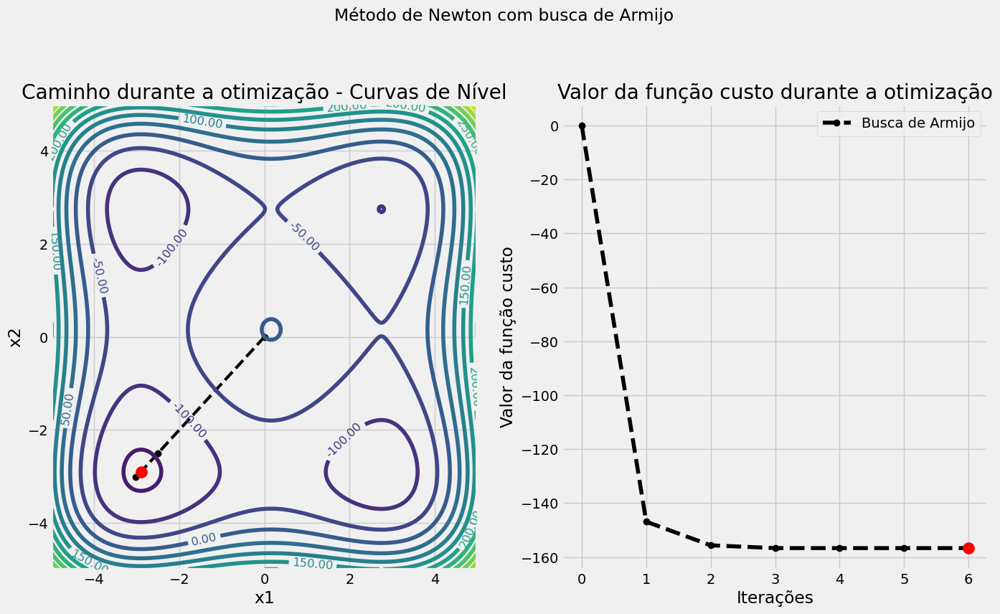

Chute inicial: y = -76, x = [2, 2] 



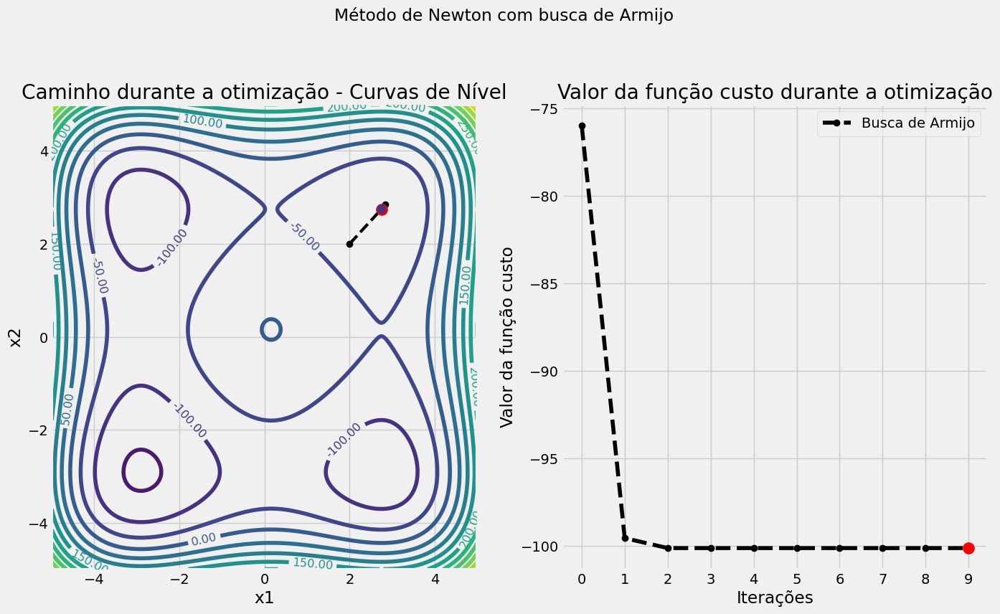

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[-2.9, -2.9]",4,0,"[-2.90353403, -2.90353403]",-156.66466282,0.00000000
1,"[2.76, 2.76]",8,10,"[2.74680277, 2.74680277]",-100.11778662,0.00000000
2,"[4, 4]",7,0,"[2.74680277, 2.74680277]",-100.11778662,0.00000000
3,"[0, 0]",7,1,"[-2.90353403, -2.90353403]",-156.66466282,0.00000000
4,"[2, 2]",10,12,"[2.74680277, 2.74680277]",-100.11778662,0.00000000


In [76]:
chutes = [[-2.9, -2.9], [2.76, 2.76], [4, 4], [0, 0], [2, 2]]
resultados_finais_df = processa_chutes(chutes, f_2, f_2_grad, method='2',range=np.linspace(-5, 5, 500))
display(resultados_finais_df)

#Função 3


Chute inicial: y = 0, x = [3, 2] 



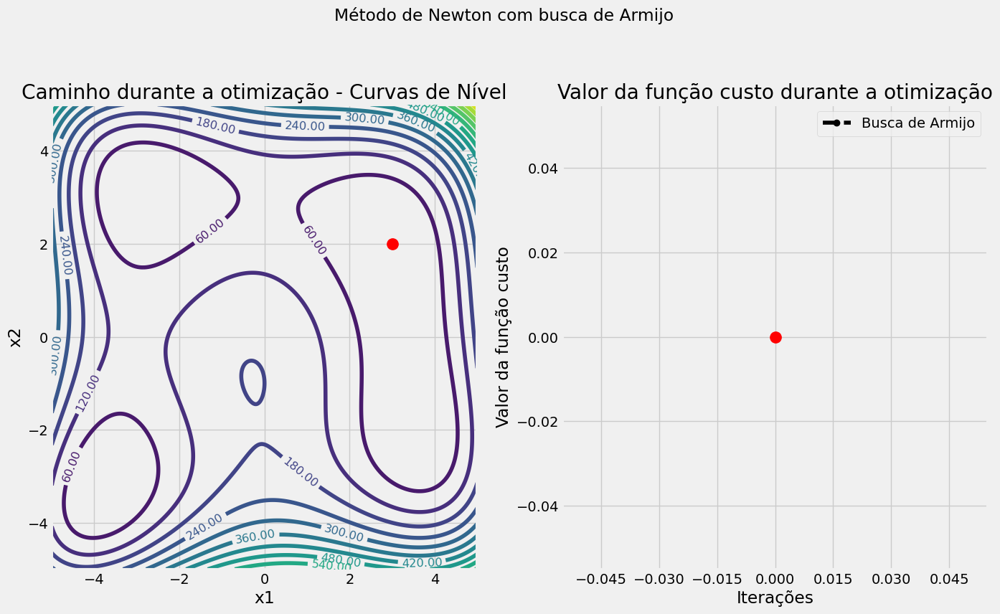

Chute inicial: y = 106, x = [-4, 4] 



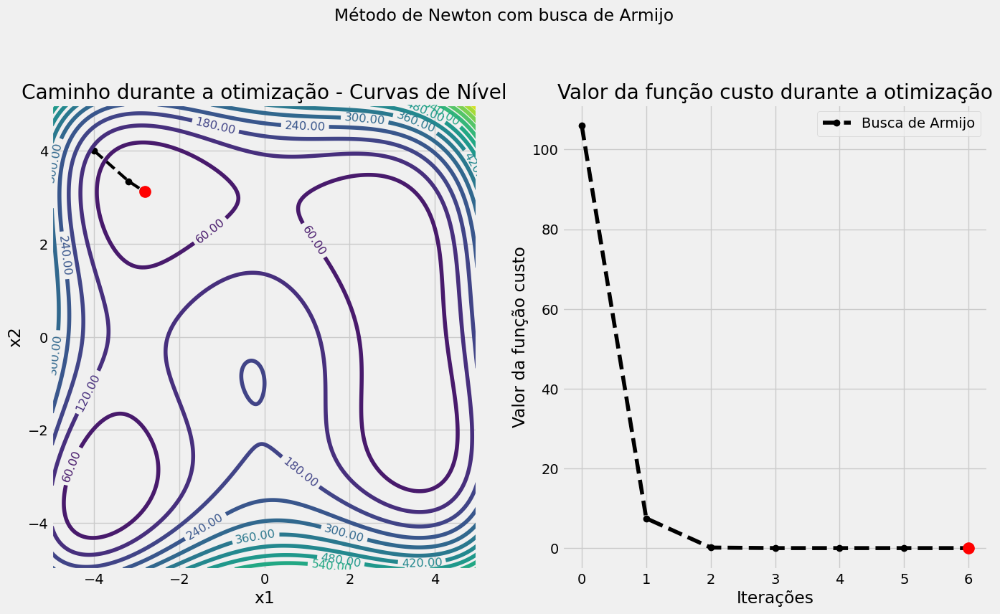

Chute inicial: y = 180, x = [3, -4] 



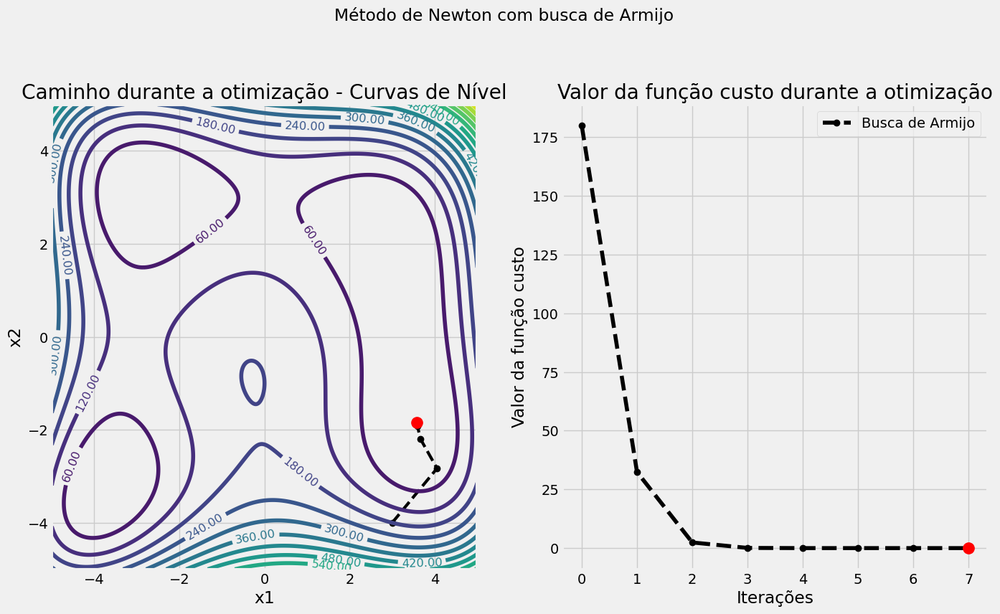

Chute inicial: y = 170, x = [0, 0] 



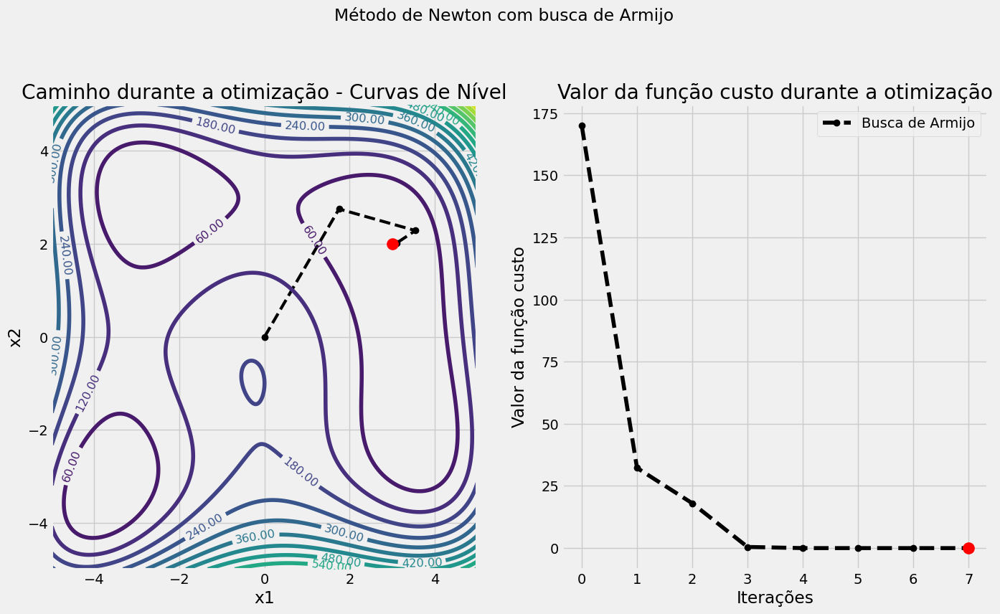

Chute inicial: y = 26, x = [3, 3] 



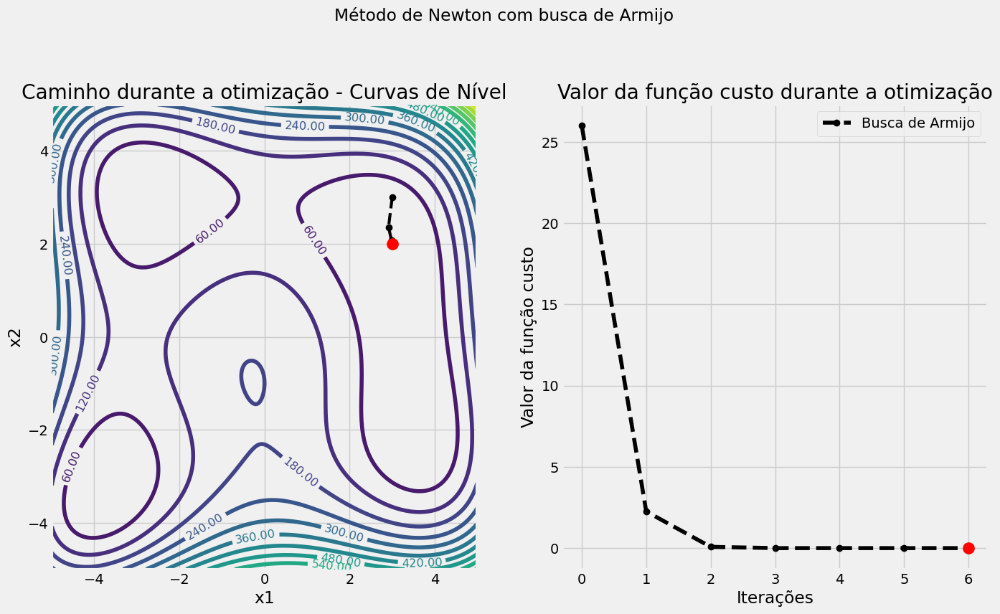

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[3, 2]",1,0,"[3, 2]",0.00000000,0.00000000
1,"[-4, 4]",7,0,"[-2.80511809, 3.13131252]",0.00000000,0.00000000
2,"[3, -4]",8,0,"[3.58442834, -1.84812653]",0.00000000,0.00000000
3,"[0, 0]",8,7,"[3.0, 2.0]",0.00000000,0.00000000
4,"[3, 3]",7,0,"[3.0, 2.0]",0.00000000,0.00000000


In [77]:
chutes = [[3, 2], [-4, 4], [3, -4], [0, 0], [3, 3]]
resultados_finais_df = processa_chutes(chutes, f_3, f_3_grad, method='2',range=np.linspace(-5,5, 500))
display(resultados_finais_df)

#Método Quase-Newton - BFGS com condição de Armijo

O método $\textbf{BFGS}$ é um método Quasi-Newton, sendo uma alternativa apresentada para o problema encontrado no Método de Newton, em que é necessário calcular a matriz Hessiana $\nabla^{2}{f(\vec{x})}$, ($x \in \Re^{n}$), que é muito cara.
Esse problema é contornado calculando uma matriz que serve como uma aproximação para a matriz Hessiana, não sendo necessários, portanto, o seu cálculo diretamente e o cálculo de sua inversa, como é feito no método de Newton.

# Algoritmo - Método BFGS com condição de Armijo



A partir de um ponto $x_{0} \in \Re^{n}$ ($\textit{initial guess}$) e uma matriz inicial $B_{0} \equiv \mathbb{I}_{n}$, com $n \in \mathbb{N}$, realiza-se os seguintes passos:
$$
$$1. Obter uma direção de descida $d_{k} = - B_{k} \cdot \nabla f(x_{k})$;
$$
$$2. Realizar busca linear e determinar $\lambda_{k}$ que satisfaz a condição de Armijo;
$$
$$3.  Atualizar o ponto $x_{k+1} = x_{k} + \lambda_{k} \, d_{k} = x_{k} + s_{k}$;
$$
$$4. Calcular a diferença de gradientes $y_{k} = \nabla f(x_{k+1}) - \nabla f(x_{k})$;
$$
$$5. Atualizar a matriz $B_{k+1}$ que aproxima a Hessiana:
\begin{equation}\
 B_{k+1} = B_{k} + \dfrac{(s^{T}_{k} y_{k}+ y^{T}_{k}B_{k}y_{k})(s_{k}s^{T}_{k})}{(s^{T}_{k}y_{k})^{2}} - \dfrac{B_{k}y_{k}s^{T}_{k} + s_{k}y^{T}_{k}B_{k}}{s^{T}_{k}y_{k}}
\end{equation}$$
$$


$$
$$Repete até satisfazer algum critérios de parada.



In [78]:
def BFGS(f, f_grad, chute, eta = 0.02, tol=1e-8):

  """ Algoritmo (BFGS) com busca de Armijo.

    Parâmetros
    --------------------
    f : callable
        Função custo
    f_grad : callable
        Gradiente da função f
    chute : array
        Valor inicial de x ("chute")
    eta : float, opcional
        Constante de decréscimo de Armijo. Padrão = 0.02
    tol : float, opcional
        Tolerância desejada. Padrão = 1e-8

    Saída
    --------------------
    xk : array
        valores de xk
    yk : array
        valores da função custo em cada xk
    grad_f : array
      valores da norma do gradiente da f em xk
    iteracoesArmijo: int
        numero de iterações de armijo
      """


  # dimensão do problema e matriz B_{k = 0} = Id(n) (identidade de ordem n)
  n = len(chute)
  Bk =  np.eye(len(chute))
  max_iter = 500

  # Valores iniciais de x_{k+1}, x_{k}, f_{x_{k}}, grad_{f(x_{k})} e norma do gradiente
  xk = chute
  xprev = chute
  fk = f(xk)
  grad_fk = f_grad(xk)
  grad_fk_norm = np.linalg.norm(grad_fk)

  # Inicializa o número de iterações e a lista para fazer os plots dos valores de x e y
  iteracoesArmijo = 0
  num_iter = 0
  x_pontos = [xk]
  y_pontos = [fk]
  grad_f = [grad_fk_norm]

  print(f'Chute inicial: y = {fk}, x = {xk} \n')

  while (grad_fk_norm > tol and num_iter < max_iter):

    if (np.linalg.norm(f(xk)) > 1e16) or (grad_fk_norm > 1e16):
      print("\nErro: Overflow\n")
      break

    # direção (método de Newton)
    dk = - Bk @ f_grad(xprev)

    # performa busca de Armijo com x_{k} (x prévio)
    lambda_, _,iArmijo = Armijo_Search(f, xprev, dk, eta)
    iteracoesArmijo += iArmijo

    # direção e valor de x_{k+1} = x_{k} + \lambda * d_{k} = x_{k} + s_{k}
    sk = lambda_ * dk
    xk = xk + lambda_ * dk

    # y_{k} é a diferença do gradiente da f em x_{k+1} com o gradiente da f em x_{k}
    yk = np.subtract(f_grad(xk), f_grad(xprev))

    # arruma os tamanhos
    yk = np.array([yk]).reshape(-1, 1)
    sk = np.array([sk]).reshape(-1, 1)

    # denominador do BFGS update
    denominador = np.dot(sk.T, yk)[0]  # escalar

    # numerador da segunda parcela do BFGS update
    num_1 = ((denominador + (yk.T @ (Bk @ yk))) * (sk @ sk.T))/(denominador ** 2)

    # numerador da terceira parcela do BFGS update
    num_2 = ((Bk @ (yk @ sk.T)) + (sk @ (yk.T @ Bk)))/denominador

    # BFGS update
    Bk = Bk + np.subtract(num_1, num_2)

    grad_fk = f_grad(xk)
    grad_fk_norm = np.linalg.norm(grad_fk)

    x_pontos.append(xk)
    y_pontos.append(np.round(f(xk), 10))
    grad_f.append(grad_fk_norm)

    xprev = xk
    num_iter += 1

  # número máximo de iterações
  if num_iter == max_iter:
    print('\nNúmero máximo de iterações atingido.\n')

  return np.array(x_pontos), np.array(y_pontos), np.array(grad_f), iteracoesArmijo

#Testes - (Método BFGS)
##Nesta parte algumas funções exemplo serão testadas utilizando o Método BFGS com busca linear de Armijo.

#Função 1

Chute inicial: y = 0, x = [1, 1] 



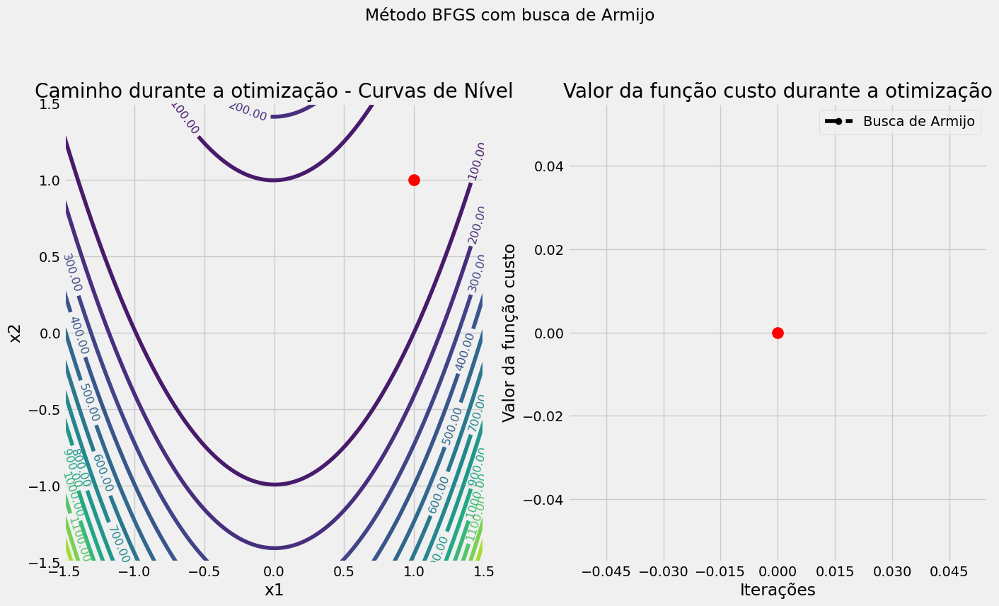

Chute inicial: y = 2.5999999999999974, x = [0.8, 0.8] 



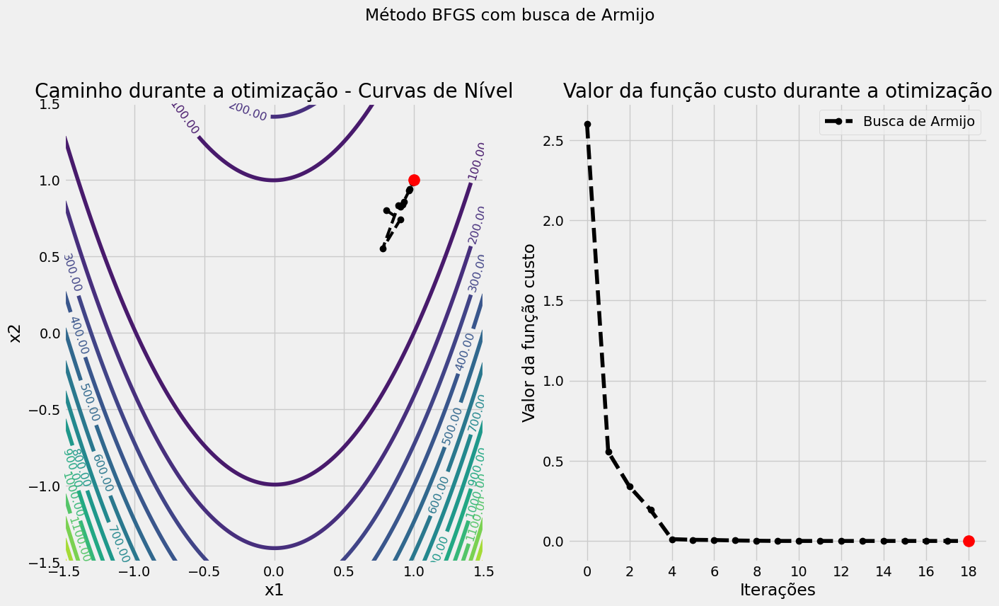

Chute inicial: y = 6.5, x = [0.5, 0.5] 



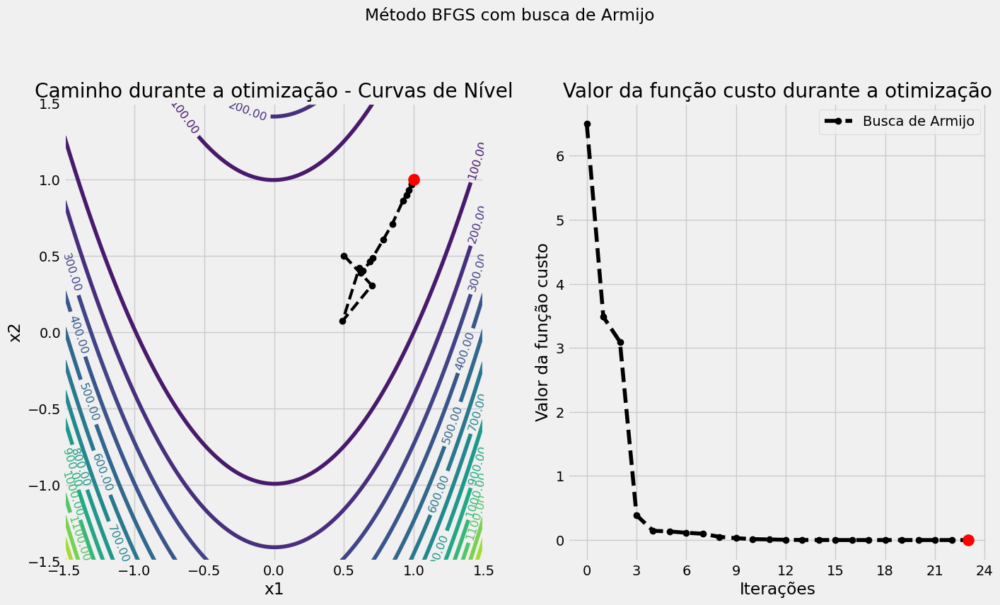

Chute inicial: y = 1, x = [0, 0] 



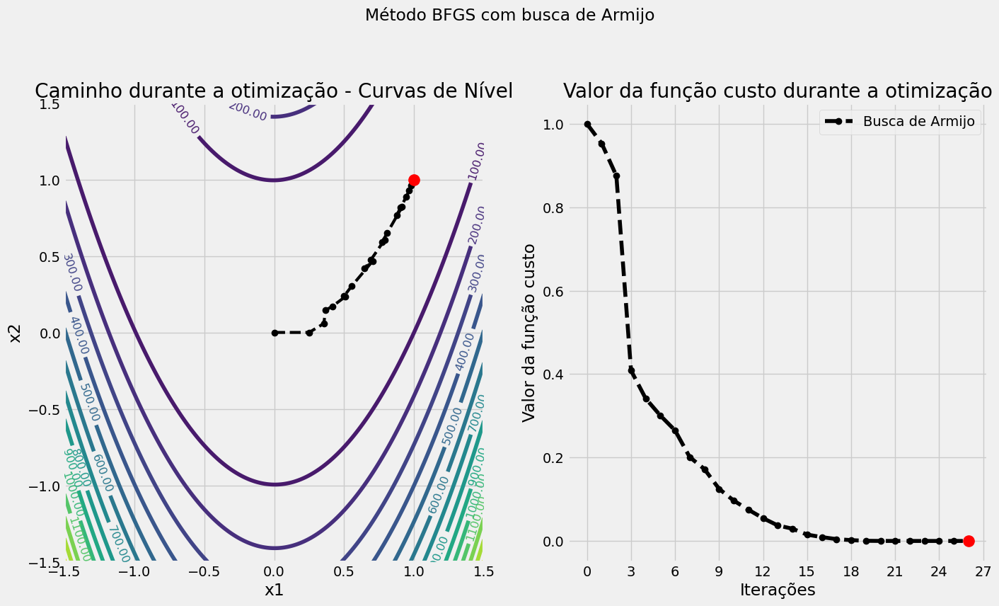

Chute inicial: y = 13.220000000000002, x = [-0.9, 0.5] 



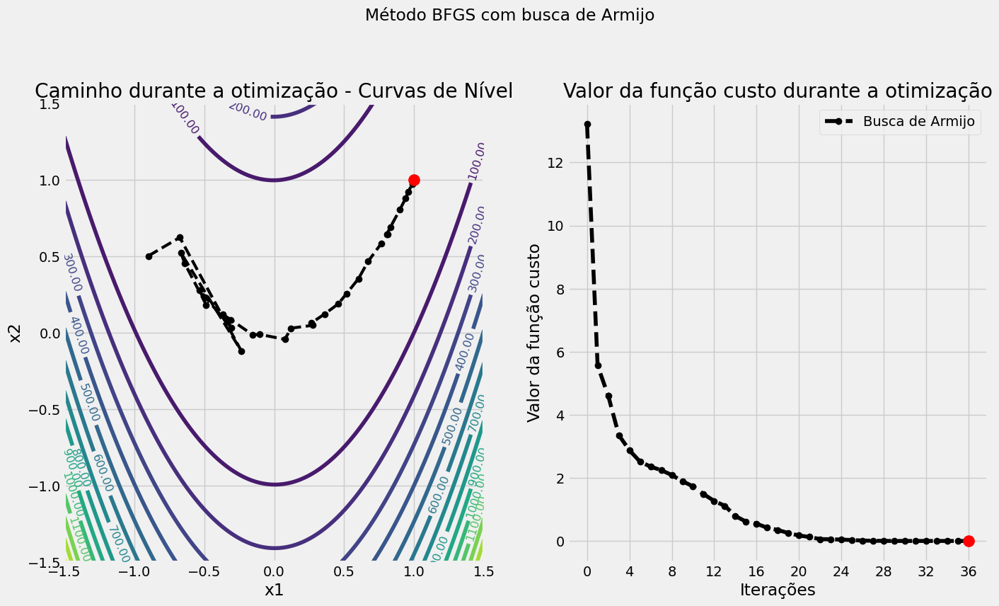

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[1, 1]",1,0,"[1, 1]",0.00000000,0.00000000
1,"[0.8, 0.8]",19,11,"[1.0, 1.0]",0.00000000,0.00000000
2,"[0.5, 0.5]",24,13,"[1.0, 1.0]",0.00000000,0.00000000
3,"[0, 0]",27,13,"[1.0, 1.0]",0.00000000,0.00000000
4,"[-0.9, 0.5]",37,18,"[1.0, 1.0]",0.00000000,0.00000000


In [79]:
chutes = [[1, 1], [0.8, 0.8], [0.5, 0.5], [0, 0], [-0.9, 0.5]]
resultados_finais_df = processa_chutes(chutes, f_1, f_1_grad,method='3',range=np.linspace(-1.5, 1.5, 500))
display(resultados_finais_df)

#Função 2


Chute inicial: y = -156, x = [-3, -3] 



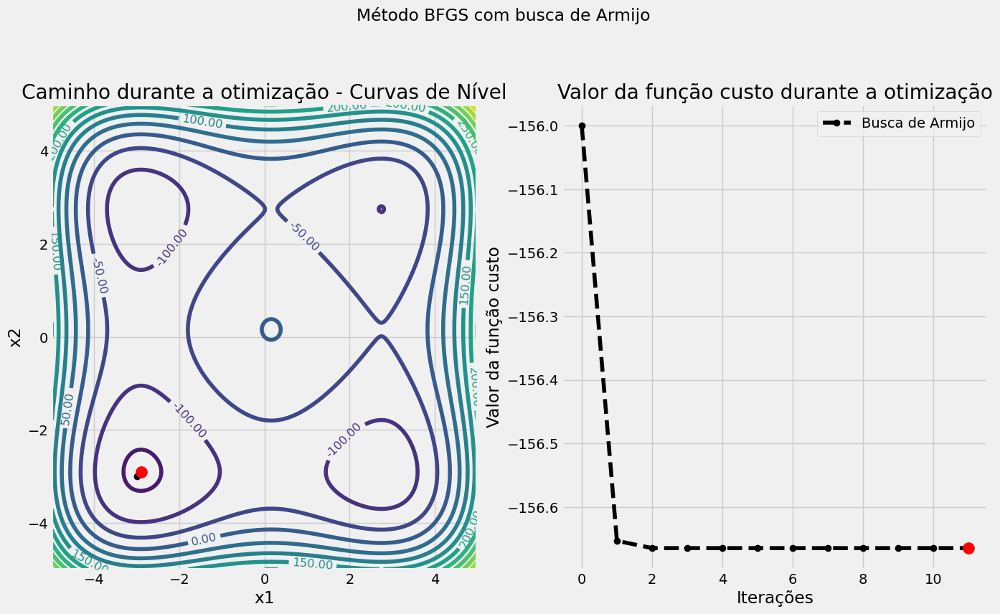

Chute inicial: y = 0, x = [-4, 4] 



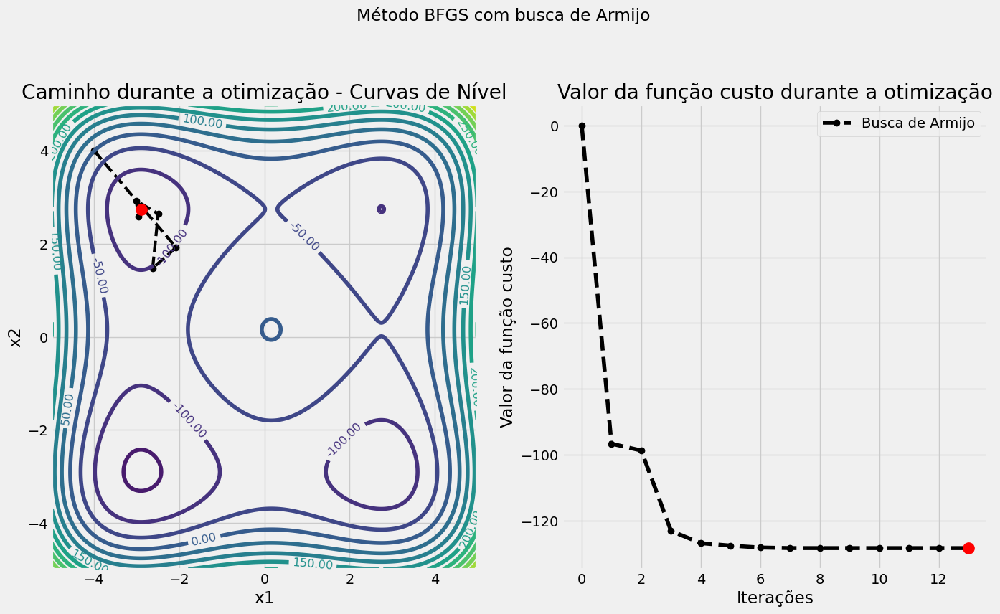

Chute inicial: y = -68, x = [3, -4] 



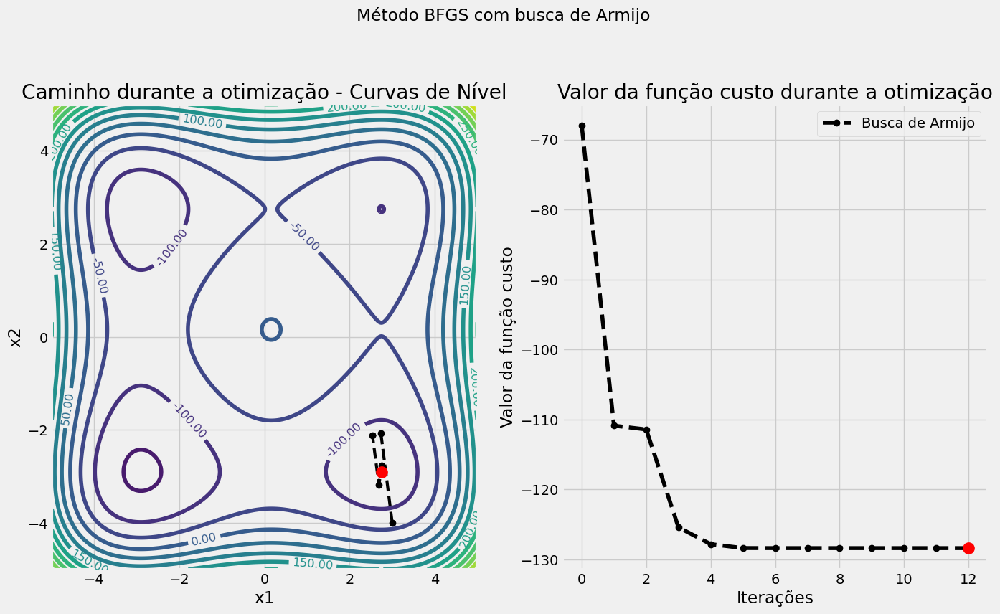

Chute inicial: y = -48, x = [2, 1] 



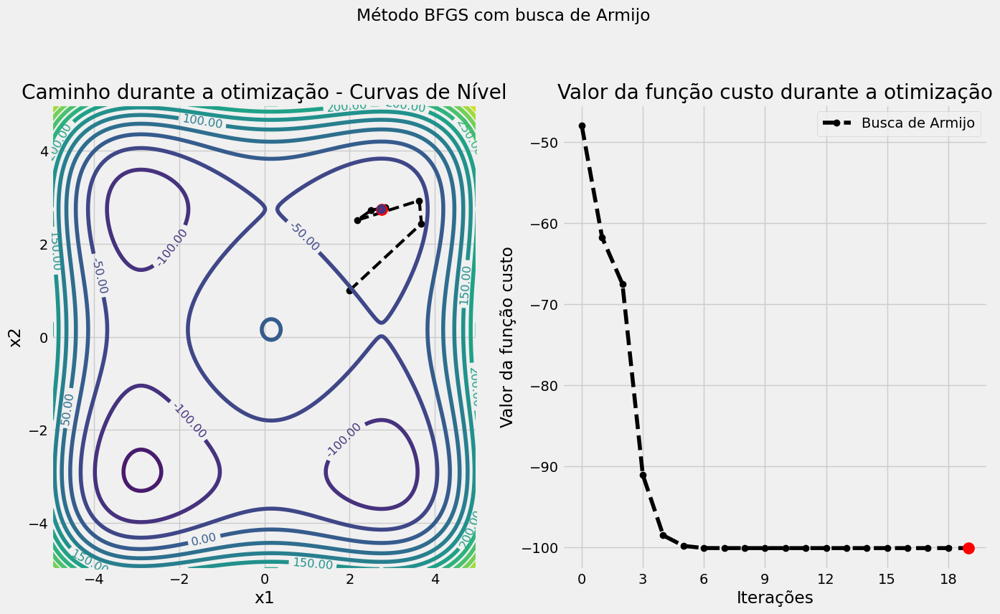

Chute inicial: y = -48, x = [1, 2] 



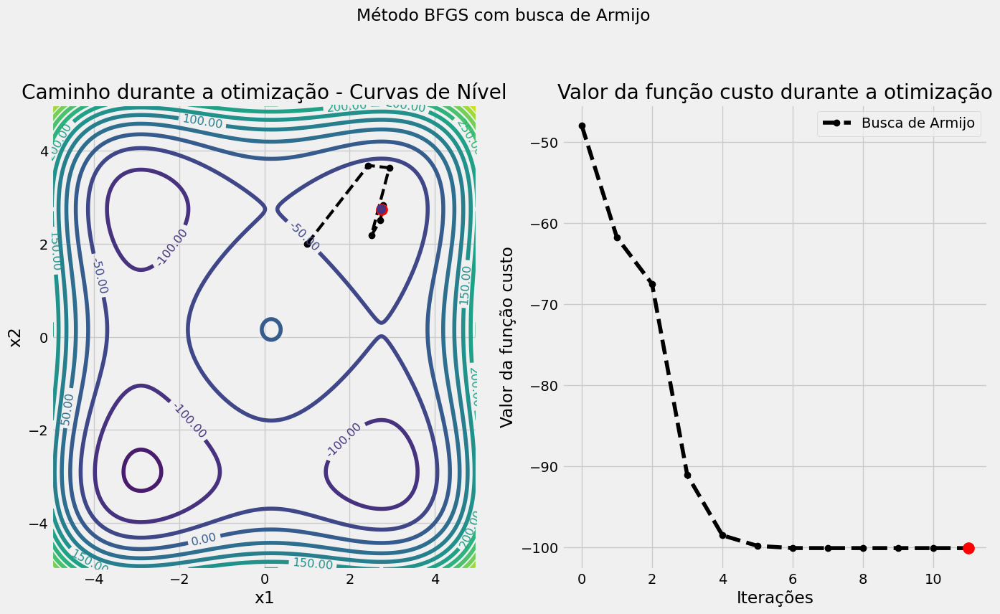

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[-3, -3]",12,23,"[-2.90353403, -2.90353403]",-156.66466282,0.00000000
1,"[-4, 4]",14,9,"[-2.90353403, 2.74680277]",-128.39122472,0.00000000
2,"[3, -4]",13,10,"[2.74680277, -2.90353403]",-128.39122472,0.00000000
3,"[2, 1]",20,28,"[2.74680277, 2.74680277]",-100.11778662,0.00000000
4,"[1, 2]",12,10,"[2.74680277, 2.74680277]",-100.11778662,0.00000000


In [80]:
chutes = [[-3, -3], [-4, 4], [3, -4], [2, 1], [1, 2]]
resultados_finais_df = processa_chutes(chutes, f_2, f_2_grad, method='3',range=np.linspace(-5, 5, 500))
display(resultados_finais_df)

#Função 3

Chute inicial: y = 0, x = [3, 2] 



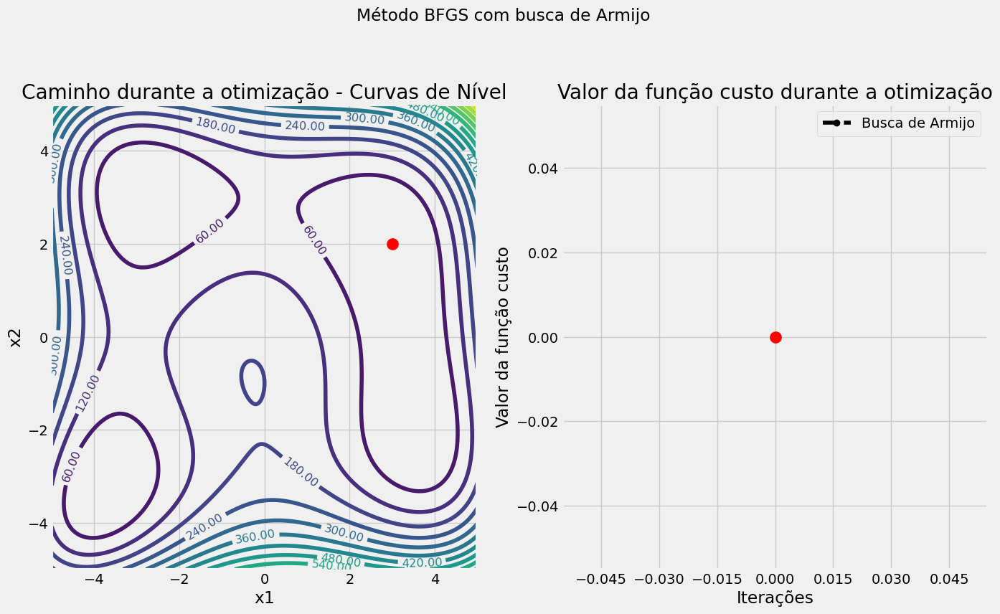

Chute inicial: y = 106, x = [-4, 4] 



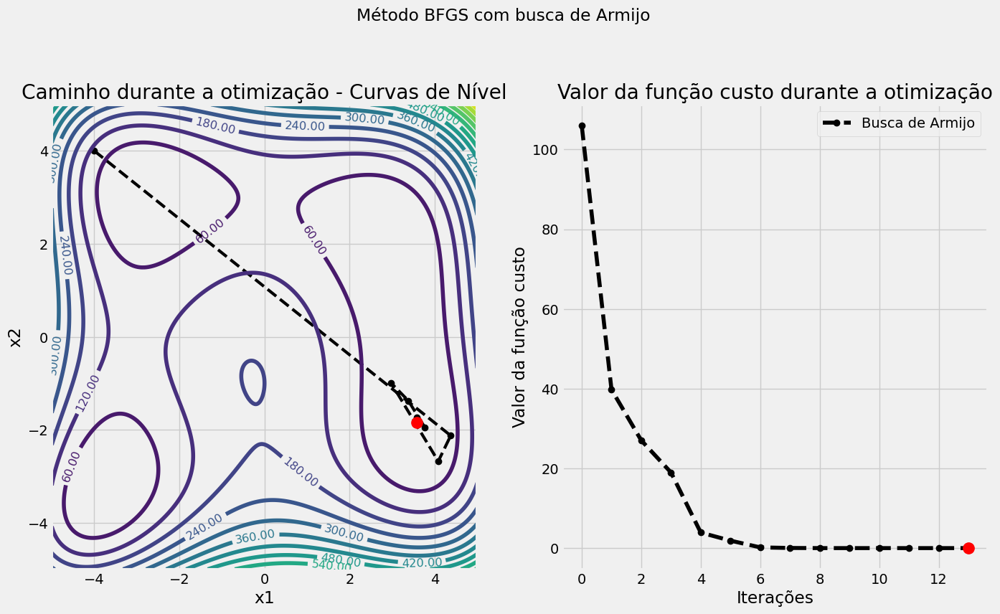

Chute inicial: y = 180, x = [3, -4] 



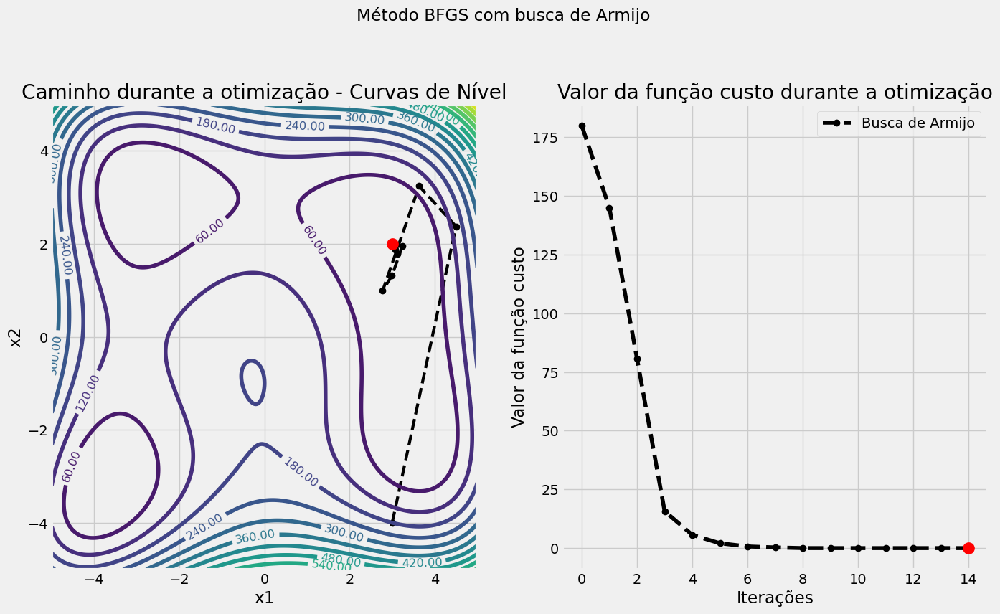

Chute inicial: y = 170, x = [0, 0] 



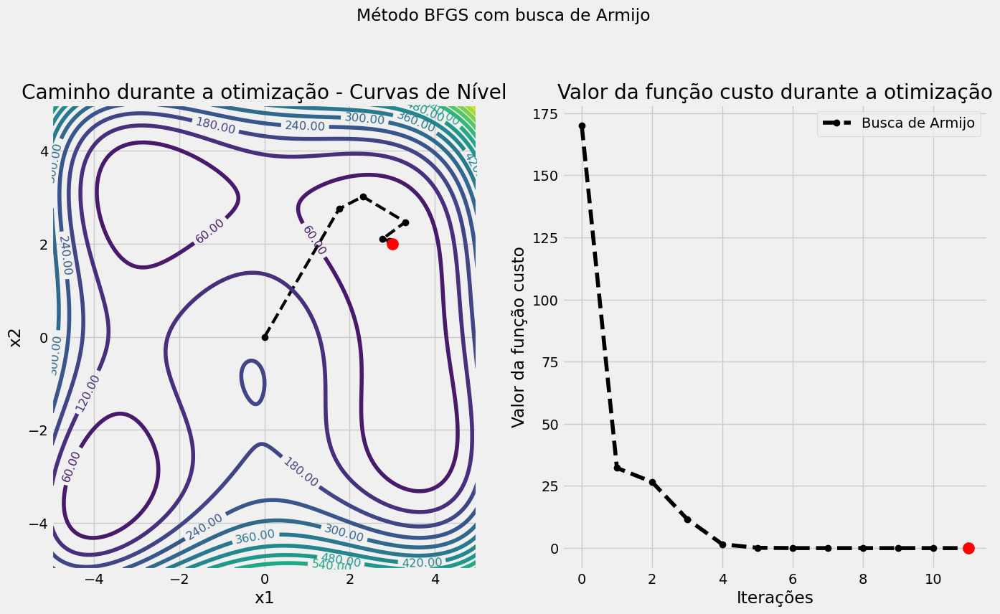

Chute inicial: y = 26, x = [3, 3] 



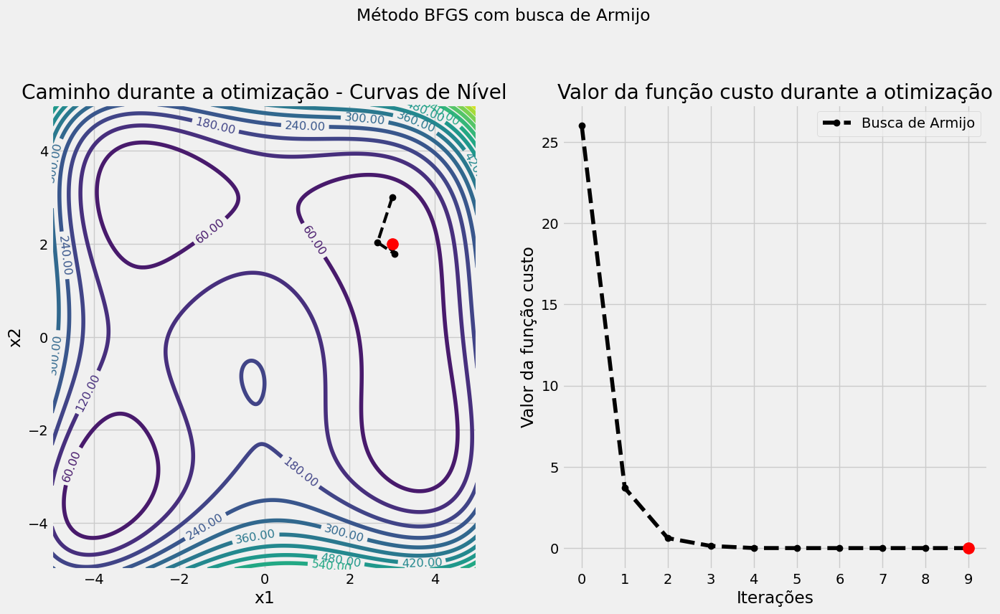

,Ponto inicial,Número de iterações,Número de chamadas de Armijo,Ponto ótimo,Valor ótimo,Erro de aproximação
0,"[3, 2]",1,0,"[3, 2]",0.00000000,0.00000000
1,"[-4, 4]",14,11,"[3.58442834, -1.84812653]",0.00000000,0.00000000
2,"[3, -4]",15,12,"[3.0, 2.0]",0.00000000,0.00000000
3,"[0, 0]",12,11,"[3.0, 2.0]",0.00000000,0.00000000
4,"[3, 3]",10,11,"[3.0, 2.0]",0.00000000,0.00000000


In [81]:
chutes = [[3, 2], [-4, 4], [3, -4], [0, 0], [3, 3]]
resultados_finais_df = processa_chutes(chutes, f_3, f_3_grad, method='3',range=np.linspace(-5,5, 500))
display(resultados_finais_df)